<h1><center><font size="6">EDA of CareerVillage.org data</font></center></h1>

<h2><center><font size="4">Dataset used: Data Science for Good: CareerVillage.org</font></center></h2>

<img src="https://www.ffwd.org/wp-content/uploads/CareerVillage-logo.png" width="800" align="middle"></img>

# <a id='1'>Introduction</a>

Hello everyone!

This notebook is a general attempt to tell about the data that CareerVillage has provided for analysis.

Here is description of tables that are available:

- **answers.csv:** Answers are what this is all about! Answers get posted in response to questions. Answers can only be posted by users who are registered as Professionals. However, if someone has changed their registration type after joining, they may show up as the author of an Answer even if they are no longer a Professional.

- **comments.csv:** Comments can be made on Answers or Questions. We refer to whichever the comment is posted to as the "parent" of that comment. Comments can be posted by any type of user. Our favorite comments tend to have "Thank you" in them :)

- **emails.csv:** Each email corresponds to one specific email to one specific recipient. The frequency_level refers to the type of email template which includes immediate emails sent right after a question is asked, daily digests, and weekly digests.

- **group_memberships.csv:** Any type of user can join any group. There are only a handful of groups so far.

- **groups.csv:** Each group has a "type". For privacy reasons we have to leave the group names off.

- **matches.csv:** Each row tells you which questions were included in emails. If an email contains only one question, that email's ID will show up here only once. If an email contains 10 questions, that email's ID would show up here 10 times.

- **professionals.csv:** We call our volunteers "Professionals", but we might as well call them Superheroes. They're the grown ups who volunteer their time to answer questions on the site.

- **questions.csv:** Questions get posted by students. Sometimes they're very advanced. Sometimes they're just getting started. It's all fair game, as long as it's relevant to the student's future professional success.

- **school_memberships.csv:** Just like group_memberships, but for schools instead.

- **students.csv:** Students are the most important people on CareerVillage.org. They tend to range in age from about 14 to 24. They're all over the world, and they're the reason we exist!

- **tag_questions.csv:** Every question can be hashtagged. We track the hashtag-to-question pairings, and put them into this file.

- **tag_users.csv:** Users of any type can follow a hashtag. This shows you which hashtags each user follows.

- **tags.csv:** Each tag gets a name.

# <a id='2'>Install Kaggle CLI & Load the data</a>

[Here](https://github.com/Kaggle/kaggle-api) is the link with instructions for CLI installation and configuration.

In [226]:
! pip install kaggle --upgrade

Requirement already up-to-date: kaggle in /usr/local/lib/python3.6/dist-packages (1.5.4)


In [227]:
! ls -alh ~/.kaggle

total 16K
drwxr-xr-x 2 root root 4.0K Jun 25 10:10 .
drwx------ 1 root root 4.0K Jun 25 12:04 ..
-rw------- 1 root root   64 Jun 25 10:14 kaggle.json


In [0]:
! echo "{\"username\":\"ioohooi\",\"key\":\"\"}" > ~/.kaggle/kaggle.json

In [0]:
! cat ~/.kaggle/kaggle.json

In [0]:
! chmod 600 /root/.kaggle/kaggle.json

In [231]:
! kaggle -v

Kaggle API 1.5.4


In [232]:
! kaggle -h

usage: kaggle [-h] [-v] {competitions,c,datasets,d,kernels,k,config} ...

optional arguments:
  -h, --help            show this help message and exit
  -v, --version         show program's version number and exit

commands:
  {competitions,c,datasets,d,kernels,k,config}
                        Use one of:
                        competitions {list, files, download, submit, submissions, leaderboard}
                        datasets {list, files, download, create, version, init, metadata, status}
                        config {view, set, unset}
    competitions        Commands related to Kaggle competitions
    datasets            Commands related to Kaggle datasets
    kernels             Commands related to Kaggle kernels
    config              Configuration settings


In [233]:
! kaggle competitions download -c data-science-for-good-careervillage

 47% 9.00M/19.3M [00:00<00:00, 36.3MB/s]
100% 19.3M/19.3M [00:00<00:00, 55.4MB/s]
  0% 0.00/1.65M [00:00<?, ?B/s]
100% 1.65M/1.65M [00:00<00:00, 109MB/s]
 24% 5.00M/20.8M [00:00<00:00, 33.4MB/s]
100% 20.8M/20.8M [00:00<00:00, 82.8MB/s]
  0% 0.00/67.0k [00:00<?, ?B/s]
100% 67.0k/67.0k [00:00<00:00, 67.4MB/s]
  0% 0.00/2.32k [00:00<?, ?B/s]
100% 2.32k/2.32k [00:00<00:00, 1.79MB/s]
 71% 12.0M/16.8M [00:00<00:00, 124MB/s]
100% 16.8M/16.8M [00:00<00:00, 107MB/s]
  0% 0.00/1.35M [00:00<?, ?B/s]
100% 1.35M/1.35M [00:00<00:00, 91.8MB/s]
  0% 0.00/3.63M [00:00<?, ?B/s]
100% 3.63M/3.63M [00:00<00:00, 119MB/s]
  0% 0.00/219k [00:00<?, ?B/s]
100% 219k/219k [00:00<00:00, 171MB/s]
  0% 0.00/935k [00:00<?, ?B/s]
100% 935k/935k [00:00<00:00, 114MB/s]
  0% 0.00/1.44M [00:00<?, ?B/s]
100% 1.44M/1.44M [00:00<00:00, 96.3MB/s]
  0% 0.00/1.30M [00:00<?, ?B/s]
100% 1.30M/1.30M [00:00<00:00, 90.5MB/s]
  0% 0.00/318k [00:00<?, ?B/s]
100% 318k/318k [00:00<00:00, 104MB/s]
  0% 0.00/984k [00:00<?, ?B/s]
100% 984k

In [234]:
! ls -alh /content/

total 70M
drwxr-xr-x 1 root root 4.0K Jun 25 12:40 .
drwxr-xr-x 1 root root 4.0K Jun 25 09:47 ..
-rw-r--r-- 1 root root 985K Jun 25 12:40 answer_scores.csv.zip
-rw-r--r-- 1 root root  20M Jun 25 12:40 answers.csv.zip
-rw-r--r-- 1 root root 1.7M Jun 25 12:40 comments.csv.zip
drwxr-xr-x 1 root root 4.0K Jun 18 16:14 .config
drwxr-xr-x 2 root root 4.0K Jun 25 10:48 data-science-for-good-careervillage
-rw-r--r-- 1 root root  21M Jun 25 12:40 emails.csv.zip
drwx------ 3 root root 4.0K Jun 25 12:04 gdrive
-rw-r--r-- 1 root root  67K Jun 25 12:40 group_memberships.csv
-rw-r--r-- 1 root root 2.4K Jun 25 12:40 groups.csv
-rw-r--r-- 1 root root  17M Jun 25 12:40 matches.csv.zip
-rw-r--r-- 1 root root 1.4M Jun 25 12:40 professionals.csv.zip
-rw-r--r-- 1 root root 819K Jun 25 12:40 question_scores.csv
-rw-r--r-- 1 root root 3.7M Jun 25 12:40 questions.csv.zip
drwxr-xr-x 1 root root 4.0K Jun 18 16:14 sample_data
-rw-r--r-- 1 root root 220K Jun 25 12:40 school_memberships.csv
-rw-r--r-- 1 root root 

In [0]:
%%sh

mkdir /content/data-science-for-good-careervillage/

In [0]:
%%sh

cd /content

for entry in `ls *.csv*`; do
    mv $entry /content/data-science-for-good-careervillage/
done

In [239]:
%%sh

cd /content/data-science-for-good-careervillage/

for entry in `ls *.csv.zip`; do
    unzip $entry
done

Archive:  answer_scores.csv.zip
Archive:  answers.csv.zip
Archive:  comments.csv.zip
Archive:  emails.csv.zip
Archive:  matches.csv.zip
Archive:  professionals.csv.zip
Archive:  questions.csv.zip
Archive:  students.csv.zip
Archive:  tag_questions.csv.zip
Archive:  tag_users.csv.zip


replace answer_scores.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename:  NULL
(EOF or read error, treating as "[N]one" ...)
replace answers.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename:  NULL
(EOF or read error, treating as "[N]one" ...)
replace comments.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename:  NULL
(EOF or read error, treating as "[N]one" ...)
replace emails.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename:  NULL
(EOF or read error, treating as "[N]one" ...)
replace matches.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename:  NULL
(EOF or read error, treating as "[N]one" ...)
replace professionals.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename:  NULL
(EOF or read error, treating as "[N]one" ...)
replace questions.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename:  NULL
(EOF or read error, treating as "[N]one" ...)
replace students.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename:  NULL
(EOF or read error, treating as "[N]one" ...)
replace tag_questions.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename:  NULL
(EOF or read error, treati

In [240]:
! ls -alh /content/data-science-for-good-careervillage/

total 485M
drwxr-xr-x 2 root root 4.0K Jun 25 12:43 .
drwxr-xr-x 1 root root 4.0K Jun 25 12:43 ..
---------- 1 root root 1.8M Mar 26 14:33 answer_scores.csv
-rw-r--r-- 1 root root 985K Jun 25 12:40 answer_scores.csv.zip
---------- 1 root root  50M Feb 20 20:26 answers.csv
-rw-r--r-- 1 root root  20M Jun 25 12:40 answers.csv.zip
---------- 1 root root 4.3M Feb 20 20:26 comments.csv
-rw-r--r-- 1 root root 1.7M Jun 25 12:40 comments.csv.zip
---------- 1 root root 169M Feb 20 20:26 emails.csv
-rw-r--r-- 1 root root  21M Jun 25 12:40 emails.csv.zip
-rw-r--r-- 1 root root  67K Jun 25 12:40 group_memberships.csv
-rw-r--r-- 1 root root 2.4K Jun 25 12:40 groups.csv
---------- 1 root root 168M Feb 20 20:26 matches.csv
-rw-r--r-- 1 root root  17M Jun 25 12:40 matches.csv.zip
---------- 1 root root 3.8M Feb 20 20:26 professionals.csv
-rw-r--r-- 1 root root 1.4M Jun 25 12:40 professionals.csv.zip
-rw-r--r-- 1 root root 819K Jun 25 12:40 question_scores.csv
---------- 1 root root 9.0M Feb 20 20:26 q

# <a id='2'>All imports necessary</a>

In [0]:
import numpy as np

import pandas as pd

import warnings

import os

import seaborn as sns

import matplotlib.pyplot as plt

import wordcloud

import matplotlib_venn

import matplotlib.image as mpimg

# <a id='3'>A bit of configuration</a>

In [0]:
warnings.filterwarnings('ignore')

%matplotlib inline

pd.options.display.max_rows = 10000

# <a id='4'>Auxiliary methods</a>

In [0]:
def plot_null_and_unique_values(df):
    f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(20, 10))
    columns = df.columns
    sns.set(font_scale=1.5)
    res = pd.DataFrame(
        {
            'unique_counts': df[columns].nunique(),
            'null_counts': df[columns].isnull().sum()
        }
    )
    res.sort_values(by='unique_counts', ascending=False, inplace=True)
    sns.barplot(
        y=res.index,
        x=res['unique_counts'].values,
        orient='h',
        ax=ax1
    )
    sns.barplot(
        y=res.index,
        x=res['null_counts'].values,
        orient='h',
        ax=ax2
    )
    ax1.axvline(x=len(df), color='red')
    ax2.axvline(x=len(df), color='red')
    plt.suptitle(
        'The general look of columns\n\
        (vertical red line shows the number of records in the dataset)'
    )
    ax1.set_title('The number of unique values per column')
    ax2.set_title('The number of null values per column')
    plt.show()

In [0]:
def plot_intersections(
    df1,
    df2,
    col1,
    col2,
    venn_label_1,
    venn_label_2,
    venn_title_1,
    pie_label_1,
    pie_label_2,
    pie_label_3,
    pie_title
):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    matplotlib_venn.venn2(
        subsets=[set(df1[col1]), set(df2[col2])],
        set_labels=[venn_label_1, venn_label_2],
        ax=ax1
    )
    ax1.set_title(venn_title_1)
    ax2.pie(
        x=[
            len(set(df1[col1]) - set(df2[col2])),
            len(set(df1[col1]) & set(df2[col2])),
            len(set(df2[col2]) - set(df1[col1]))
        ],
        labels=[
            pie_label_1,
            pie_label_2,
            pie_label_3
        ],
        autopct='%1.2f%%'
    )
    ax2.set_title(pie_title)
    plt.tight_layout()
    plt.show()

In [0]:
def get_meta_info_about_columns_and_tables(df_arr, df_name_arr):
    tables = []
    columns = []
    for df, name in zip(df_arr, df_name_arr):
        columns.extend(df.columns.values)
        tables.extend([name] * len(df.columns))
    return pd.DataFrame({'table': tables, 'column': columns})

In [0]:
def remove_table_name_prefixes(df_arr, df_name_arr):
    for df, name in zip(df_arr, df_name_arr):
        new_columns_mapping = dict(zip(df.columns, list(map(lambda column: column.replace('{}_'.format(name), ''), df.columns))))
        df.rename(new_columns_mapping, axis=1, inplace=True)

In [0]:
def extract_year_month_week_day_hour(df, datetime_column):
    df[datetime_column] = df[datetime_column].astype('datetime64')
    df['year'] = df[datetime_column].dt.year
    df['month'] = df[datetime_column].dt.month
    df['week'] = df[datetime_column].dt.week
    df['day'] = df[datetime_column].dt.day
    df['hour'] = df[datetime_column].dt.hour

In [0]:
def calculate_yearly_cumsum(df, col_name):
    df_yearly_cumcount = df.groupby('year')['id'].count().reset_index()
    df_yearly_cumcount.id = df_yearly_cumcount.id.cumsum()
    df_yearly_cumcount.rename({'id': '{}_count'.format(col_name)}, axis=1, inplace=True)
    df_yearly_cumcount.set_index('year', inplace=True)
    return df_yearly_cumcount

In [0]:
def calculate_monthly_cumsum(df, col_name):
    df_monthly_cumcount = df.groupby(['year', 'month'])['id'].count().reset_index()
    df_monthly_cumcount.sort_values(by=['year', 'month'], inplace=True)
    df_monthly_cumcount.id = df_monthly_cumcount.id.cumsum()
    df_monthly_cumcount.rename({'id': '{}_count'.format(col_name)}, axis=1, inplace=True)
    return df_monthly_cumcount

In [0]:
def calculate_weekly_cumsum(df, col_name):
    df_weekly_cumcount = df.groupby(['year', 'week'])['id'].count().reset_index()
    df_weekly_cumcount.sort_values(by=['year', 'week'], inplace=True)
    df_weekly_cumcount.id = df_weekly_cumcount.id.cumsum()
    df_weekly_cumcount.rename({'id': '{}_count'.format(col_name)}, axis=1, inplace=True)
    return df_weekly_cumcount

In [0]:
def calculate_daily_cumsum(df, col_name):
    df_daily_cumcount = df.groupby(['year', 'month', 'day'])['id'].count().reset_index()
    df_daily_cumcount.sort_values(by=['year', 'month', 'day'], inplace=True)
    df_daily_cumcount.id = df_daily_cumcount.id.cumsum()
    df_daily_cumcount.rename({'id': '{}_count'.format(col_name)}, axis=1, inplace=True)
    return df_daily_cumcount

In [0]:
def calculate_yearly_count(df, col_name):
    df_yearly_cumcount = df.groupby('year')['id'].count().reset_index()
    df_yearly_cumcount.rename({'id': '{}_count'.format(col_name)}, axis=1, inplace=True)
    df_yearly_cumcount.set_index('year', inplace=True)
    return df_yearly_cumcount

In [0]:
def calculate_monthly_count(df, col_name):
    df_monthly_cumcount = df.groupby(['year', 'month'])['id'].count().reset_index()
    df_monthly_cumcount.sort_values(by=['year', 'month'], inplace=True)
    df_monthly_cumcount.rename({'id': '{}_count'.format(col_name)}, axis=1, inplace=True)
    return df_monthly_cumcount

In [0]:
def calculate_weekly_count(df, col_name):
    df_weekly_cumcount = df.groupby(['year', 'week'])['id'].count().reset_index()
    df_weekly_cumcount.sort_values(by=['year', 'week'], inplace=True)
    df_weekly_cumcount.rename({'id': '{}_count'.format(col_name)}, axis=1, inplace=True)
    return df_weekly_cumcount

In [0]:
def calculate_daily_count(df, col_name):
    df_daily_cumcount = df.groupby(['year', 'month', 'day'])['id'].count().reset_index()
    df_daily_cumcount.sort_values(by=['year', 'month', 'day'], inplace=True)
    df_daily_cumcount.rename({'id': '{}_count'.format(col_name)}, axis=1, inplace=True)
    return df_daily_cumcount

# <a id='5'>List all files available</a>

In [0]:
data_folder = "/content/data-science-for-good-careervillage/"

In [260]:
for file in os.listdir(data_folder):
    print(file)

professionals.csv.zip
tag_questions.csv
comments.csv
tags.csv
questions.csv.zip
tag_users.csv
students.csv
comments.csv.zip
groups.csv
professionals.csv
students.csv.zip
group_memberships.csv
answer_scores.csv.zip
matches.csv.zip
emails.csv.zip
questions.csv
answers.csv
answers.csv.zip
emails.csv
answer_scores.csv
question_scores.csv
tag_users.csv.zip
matches.csv
tag_questions.csv.zip
school_memberships.csv


# <a id='6'>Read the data</a>

In [0]:
professionals = pd.read_csv(os.path.join(data_folder, 'professionals.csv'))
tag_users = pd.read_csv(os.path.join(data_folder, 'tag_users.csv'))
students = pd.read_csv(os.path.join(data_folder, 'students.csv'))
tag_questions = pd.read_csv(os.path.join(data_folder, 'tag_questions.csv'))
groups = pd.read_csv(os.path.join(data_folder, 'groups.csv'))
emails = pd.read_csv(os.path.join(data_folder, 'emails.csv'))
group_memberships = pd.read_csv(os.path.join(data_folder, 'group_memberships.csv'))
answers = pd.read_csv(os.path.join(data_folder, 'answers.csv'))
comments = pd.read_csv(os.path.join(data_folder, 'comments.csv'))
matches = pd.read_csv(os.path.join(data_folder, 'matches.csv'))
tags = pd.read_csv(os.path.join(data_folder, 'tags.csv'))
questions = pd.read_csv(os.path.join(data_folder, 'questions.csv'))
school_memberships = pd.read_csv(os.path.join(data_folder, 'school_memberships.csv'))

# <a id='7'>Quickly go through the files</a>

## <a id='71'>professionals</a>

In [262]:
professionals.head()

,professionals_id,professionals_location,professionals_industry,professionals_headline,professionals_date_joined
0,9ced4ce7519049c0944147afb75a8ce3,NaN,NaN,NaN,2011-10-05 20:35:19 UTC+0000
1,f718dcf6d2ec4cb0a52a9db59d7f9e67,NaN,NaN,NaN,2011-10-05 20:49:21 UTC+0000
2,0c673e046d824ec0ad0ebe012a0673e4,"New York, New York",NaN,NaN,2011-10-18 17:31:26 UTC+0000
3,977428d851b24183b223be0eb8619a8c,"Boston, Massachusetts",NaN,NaN,2011-11-09 20:39:29 UTC+0000
4,e2d57e5041a44f489288397c9904c2b2,NaN,NaN,NaN,2011-12-10 22:14:44 UTC+0000


In [263]:
professionals.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28152 entries, 0 to 28151
Data columns (total 5 columns):
professionals_id             28152 non-null object
professionals_location       25054 non-null object
professionals_industry       25576 non-null object
professionals_headline       26085 non-null object
professionals_date_joined    28152 non-null object
dtypes: object(5)
memory usage: 1.1+ MB


## <a id='72'>tag_users</a>

In [264]:
tag_users.head()

,tag_users_tag_id,tag_users_user_id
0,593,c72ab38e073246e88da7e9a4ec7a4472
1,1642,8db519781ec24f2e8bdc67c2ac53f614
2,638,042d2184ee3e4e548fc3589baaa69caf
3,11093,c660bd0dc1b34224be78a58aa5a84a63
4,21539,8ce1dca4e94240239e4385ed22ef43ce


In [265]:
tag_users.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136663 entries, 0 to 136662
Data columns (total 2 columns):
tag_users_tag_id     136663 non-null int64
tag_users_user_id    136663 non-null object
dtypes: int64(1), object(1)
memory usage: 2.1+ MB


## <a id='73'>students</a>

In [266]:
students.head()

,students_id,students_location,students_date_joined
0,12a89e96755a4dba83ff03e03043d9c0,NaN,2011-12-16 14:19:24 UTC+0000
1,e37a5990fe354c60be5e87376b08d5e3,NaN,2011-12-27 03:02:44 UTC+0000
2,12b402cceeda43dcb6e12ef9f2d221ea,NaN,2012-01-01 05:00:00 UTC+0000
3,a0f431fc79794edcb104f68ce55ab897,NaN,2012-01-01 05:00:00 UTC+0000
4,23aea4702d804bd88d1e9fb28074a1b4,NaN,2012-01-01 05:00:00 UTC+0000


In [267]:
students.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30971 entries, 0 to 30970
Data columns (total 3 columns):
students_id             30971 non-null object
students_location       28938 non-null object
students_date_joined    30971 non-null object
dtypes: object(3)
memory usage: 726.0+ KB


## <a id='74'>tag_questions</a>

In [268]:
tag_questions.head()

,tag_questions_tag_id,tag_questions_question_id
0,28930,cb43ebee01364c68ac61d347a393ae39
1,28930,47f55e85ce944242a5a347ab85a8ffb4
2,28930,ccc30a033a0f4dfdb2eb987012f25792
3,28930,e30b274e48d741f7bf50eb5e7171a3c0
4,28930,3d22742052df4989b311b4195cbb0f1a


In [269]:
tag_questions.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76553 entries, 0 to 76552
Data columns (total 2 columns):
tag_questions_tag_id         76553 non-null int64
tag_questions_question_id    76553 non-null object
dtypes: int64(1), object(1)
memory usage: 1.2+ MB


## <a id='75'>groups</a>

In [270]:
groups.head()

,groups_id,groups_group_type
0,eabbdf4029734c848a9da20779637d03,youth program
1,7080bf8dcf78463bb03e6863887fd715,youth program
2,bc6fc50a2b444efc8ec47111b290ffb8,youth program
3,37f002e8d5e442ca8e36e972eaa55882,youth program
4,52419ff84d4b47bebd0b0a6c1263c296,youth program


In [271]:
groups.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49 entries, 0 to 48
Data columns (total 2 columns):
groups_id            49 non-null object
groups_group_type    49 non-null object
dtypes: object(2)
memory usage: 864.0+ bytes


## <a id='76'>emails</a>

In [272]:
emails.head()

,emails_id,emails_recipient_id,emails_date_sent,emails_frequency_level
0,2337714,0c673e046d824ec0ad0ebe012a0673e4,2018-12-07 01:05:40 UTC+0000,email_notification_daily
1,2336077,0c673e046d824ec0ad0ebe012a0673e4,2018-12-06 01:14:15 UTC+0000,email_notification_daily
2,2314660,0c673e046d824ec0ad0ebe012a0673e4,2018-11-17 00:38:27 UTC+0000,email_notification_daily
3,2312639,0c673e046d824ec0ad0ebe012a0673e4,2018-11-16 00:32:19 UTC+0000,email_notification_daily
4,2299700,0c673e046d824ec0ad0ebe012a0673e4,2018-11-08 00:16:40 UTC+0000,email_notification_daily


In [273]:
emails.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1850101 entries, 0 to 1850100
Data columns (total 4 columns):
emails_id                 1850101 non-null int64
emails_recipient_id       1850101 non-null object
emails_date_sent          1850101 non-null object
emails_frequency_level    1850101 non-null object
dtypes: int64(1), object(3)
memory usage: 56.5+ MB


## <a id='77'>group_memberships</a>

In [274]:
group_memberships.head()

,group_memberships_group_id,group_memberships_user_id
0,eabbdf4029734c848a9da20779637d03,9a5aead62c344207b2624dba90985dc5
1,eabbdf4029734c848a9da20779637d03,ea7122da1c7b4244a2184a4f9f944053
2,eabbdf4029734c848a9da20779637d03,cba603f34acb4a40b3ccb53fe6681b5d
3,eabbdf4029734c848a9da20779637d03,fa9a126e63714641ae0145557a390cab
4,eabbdf4029734c848a9da20779637d03,299da113c5d1420ab525106c242c9429


In [275]:
group_memberships.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1038 entries, 0 to 1037
Data columns (total 2 columns):
group_memberships_group_id    1038 non-null object
group_memberships_user_id     1038 non-null object
dtypes: object(2)
memory usage: 16.3+ KB


## <a id='78'>answers</a>

In [276]:
answers.head()

,answers_id,answers_author_id,answers_question_id,answers_date_added,answers_body
0,4e5f01128cae4f6d8fd697cec5dca60c,36ff3b3666df400f956f8335cf53e09e,332a511f1569444485cf7a7a556a5e54,2016-04-29 19:40:14 UTC+0000,<p>Hi!</p>\n<p>You are asking a very interesti...
1,ada720538c014e9b8a6dceed09385ee3,2aa47af241bf42a4b874c453f0381bd4,eb80205482e4424cad8f16bc25aa2d9c,2018-05-01 14:19:08 UTC+0000,<p>Hi. I joined the Army after I attended coll...
2,eaa66ef919bc408ab5296237440e323f,cbd8f30613a849bf918aed5c010340be,eb80205482e4424cad8f16bc25aa2d9c,2018-05-02 02:41:02 UTC+0000,"<p>Dear Priyanka,</p><p>Greetings! I have answ..."
3,1a6b3749d391486c9e371fbd1e605014,7e72a630c303442ba92ff00e8ea451df,4ec31632938a40b98909416bdd0decff,2017-05-10 19:00:47 UTC+0000,<p>I work for a global company who values high...
4,5229c514000446d582050f89ebd4e184,17802d94699140b0a0d2995f30c034c6,2f6a9a99d9b24e5baa50d40d0ba50a75,2017-10-13 22:07:33 UTC+0000,I agree with Denise. Every single job I've had...


In [277]:
answers.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51123 entries, 0 to 51122
Data columns (total 5 columns):
answers_id             51123 non-null object
answers_author_id      51123 non-null object
answers_question_id    51123 non-null object
answers_date_added     51123 non-null object
answers_body           51122 non-null object
dtypes: object(5)
memory usage: 2.0+ MB


## <a id='79'>comments</a>

In [278]:
comments.head()

,comments_id,comments_author_id,comments_parent_content_id,comments_date_added,comments_body
0,f30250d3c2ca489db1afa9b95d481e08,9fc88a7c3323466dbb35798264c7d497,b476f9c6d9cd4c50a7bacdd90edd015a,2019-01-31 23:39:40 UTC+0000,"First, you speak to recruiters. They are train..."
1,ca9bfc4ba9464ea383a8b080301ad72c,de2415064b9b445c8717425ed70fd99a,ef4b6ae24d1f4c3b977731e8189c7fd7,2019-01-31 20:30:47 UTC+0000,Most large universities offer study abroad pro...
2,c354f6e33956499aa8b03798a60e9386,6ed20605002a42b0b8e3d6ac97c50c7f,ca7a9d7a95df471c816db82ee758f57d,2019-01-31 18:44:04 UTC+0000,"First, I want to put you at ease that the oppo..."
3,73a6223948714c5da6231937157e4cb7,d02f6d9faac24997a7003a59e5f34bd3,c7a88aa76f5f49b0830bfeb46ba17e4d,2019-01-31 17:53:28 UTC+0000,Your question submission was great! I just wan...
4,55a89a9061d44dd19569c45f90a22779,e78f75c543e84e1c94da1801d8560f65,c7a88aa76f5f49b0830bfeb46ba17e4d,2019-01-31 14:51:53 UTC+0000,Thank you. I'm new to this site. I'm sorry if ...


In [279]:
comments.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14966 entries, 0 to 14965
Data columns (total 5 columns):
comments_id                   14966 non-null object
comments_author_id            14966 non-null object
comments_parent_content_id    14966 non-null object
comments_date_added           14966 non-null object
comments_body                 14962 non-null object
dtypes: object(5)
memory usage: 584.7+ KB


## <a id='710'>matches</a>

In [280]:
matches.head()

,matches_email_id,matches_question_id
0,1721939,332a511f1569444485cf7a7a556a5e54
1,1665388,332a511f1569444485cf7a7a556a5e54
2,1636634,332a511f1569444485cf7a7a556a5e54
3,1635498,332a511f1569444485cf7a7a556a5e54
4,1620298,332a511f1569444485cf7a7a556a5e54


In [281]:
matches.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4316275 entries, 0 to 4316274
Data columns (total 2 columns):
matches_email_id       4316275 non-null int64
matches_question_id    4316275 non-null object
dtypes: int64(1), object(1)
memory usage: 65.9+ MB


## <a id='711'>tags</a>

In [282]:
tags.head()

,tags_tag_id,tags_tag_name
0,27490,college
1,461,computer-science
2,593,computer-software
3,27292,business
4,18217,doctor


In [283]:
tags.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16269 entries, 0 to 16268
Data columns (total 2 columns):
tags_tag_id      16269 non-null int64
tags_tag_name    16268 non-null object
dtypes: int64(1), object(1)
memory usage: 254.3+ KB


## <a id='712'>questions</a>

In [284]:
questions.head()

,questions_id,questions_author_id,questions_date_added,questions_title,questions_body
0,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26 UTC+0000,Teacher career question,What is a maths teacher? what is a ma...
1,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25 UTC+0000,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...
2,4ec31632938a40b98909416bdd0decff,f2c179a563024ccc927399ce529094b5,2017-02-08 19:13:38 UTC+0000,Will going abroad for your first job increase ...,I'm planning on going abroad for my first job....
3,2f6a9a99d9b24e5baa50d40d0ba50a75,2c30ffba444e40eabb4583b55233a5a4,2017-09-01 14:05:32 UTC+0000,To become a specialist in business management...,i hear business management is a hard way to ge...
4,5af8880460c141dbb02971a1a8369529,aa9eb1a2ab184ebbb00dc01ab663428a,2017-09-01 02:36:54 UTC+0000,Are there any scholarships out there for stude...,I'm trying to find scholarships for first year...


In [285]:
questions.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23931 entries, 0 to 23930
Data columns (total 5 columns):
questions_id            23931 non-null object
questions_author_id     23931 non-null object
questions_date_added    23931 non-null object
questions_title         23931 non-null object
questions_body          23931 non-null object
dtypes: object(5)
memory usage: 934.9+ KB


## <a id='713'>school_memberships</a>

In [286]:
school_memberships.head()

,school_memberships_school_id,school_memberships_user_id
0,197406,23dce13ca6164a73aec7a3cd56a4884d
1,197398,23dce13ca6164a73aec7a3cd56a4884d
2,199821,23dce13ca6164a73aec7a3cd56a4884d
3,186239,9c5803ae43ca4cf6b27ea85871625116
4,182063,9c5803ae43ca4cf6b27ea85871625116


In [287]:
school_memberships.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5638 entries, 0 to 5637
Data columns (total 2 columns):
school_memberships_school_id    5638 non-null int64
school_memberships_user_id      5638 non-null object
dtypes: int64(1), object(1)
memory usage: 88.2+ KB


# <a id='8'>Data quality</a>

## <a id='81'>Null-values, unique values counts across tables</a>

Here is the list of tables:
- professionals;
- tag_users;
- students;
- tag_questions;
- groups;
- emails;
- group_memberships;
- answers;
- comments;
- matches;
- tags;
- questions;
- school_memberships.

### <a id='811'>professionals</a>

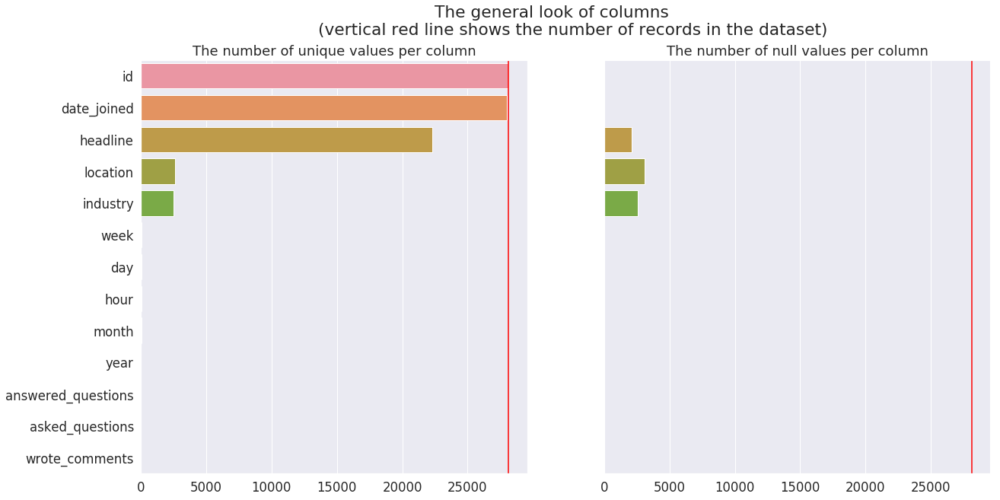

In [410]:
plot_null_and_unique_values(professionals)

### <a id='812'>tag_users</a>

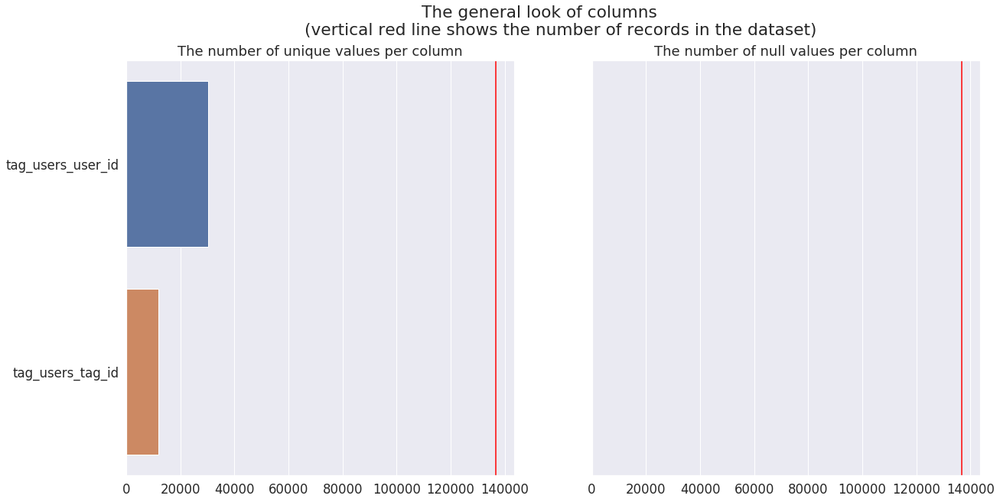

In [290]:
plot_null_and_unique_values(tag_users)

### <a id='813'>students</a>

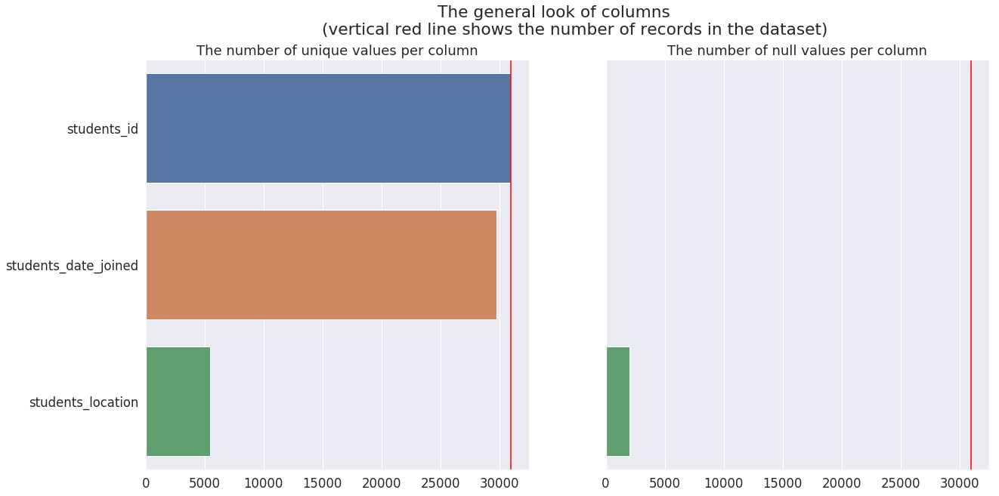

In [291]:
plot_null_and_unique_values(students)

### <a id='814'>tag_questions</a>

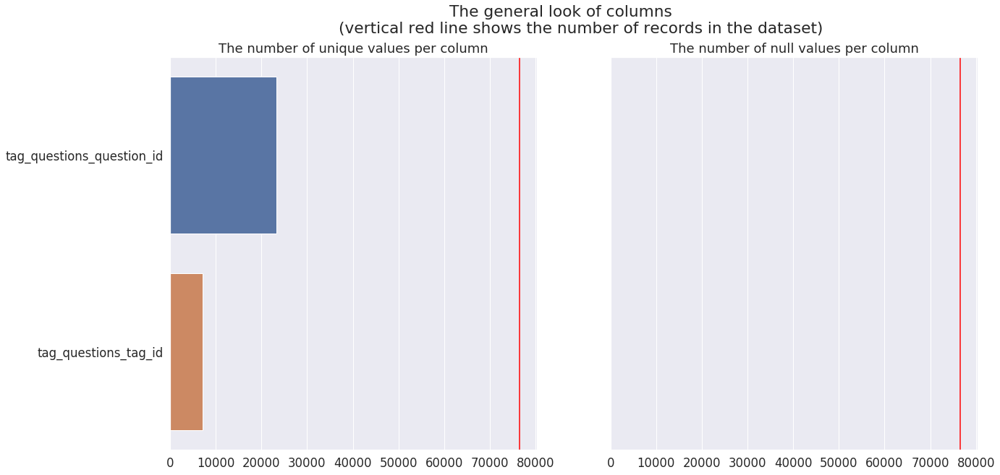

In [292]:
plot_null_and_unique_values(tag_questions)

### <a id='815'>groups</a>

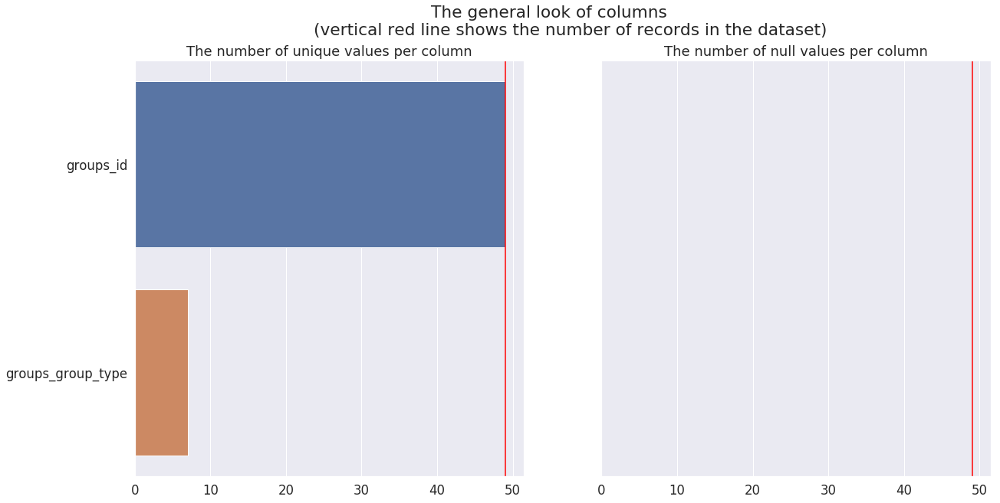

In [293]:
plot_null_and_unique_values(groups)

### <a id='816'>emails</a>

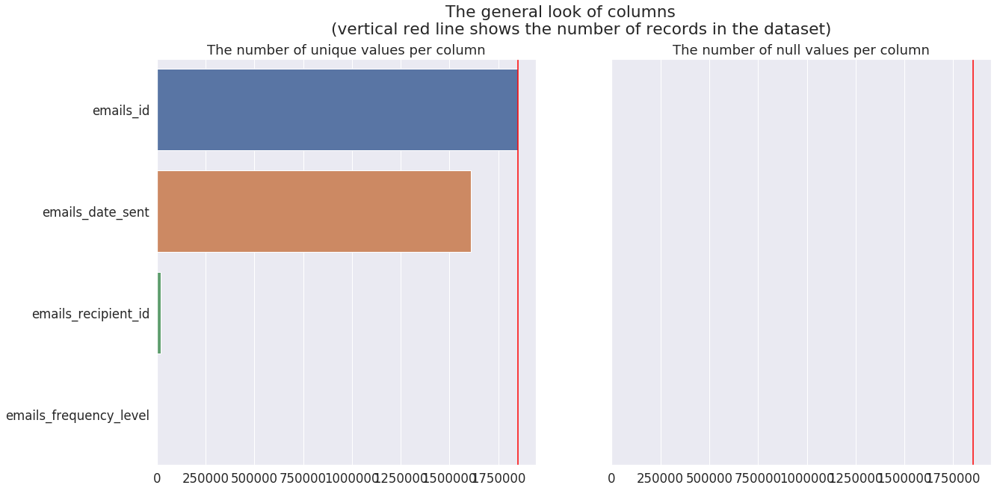

In [294]:
plot_null_and_unique_values(emails)

### <a id='817'>group_memberships</a>

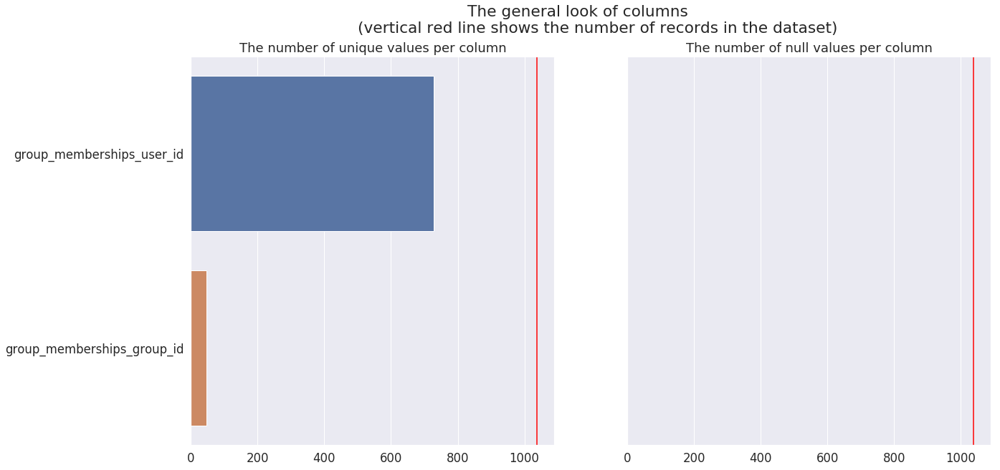

In [295]:
plot_null_and_unique_values(group_memberships)

### <a id='818'>answers</a>

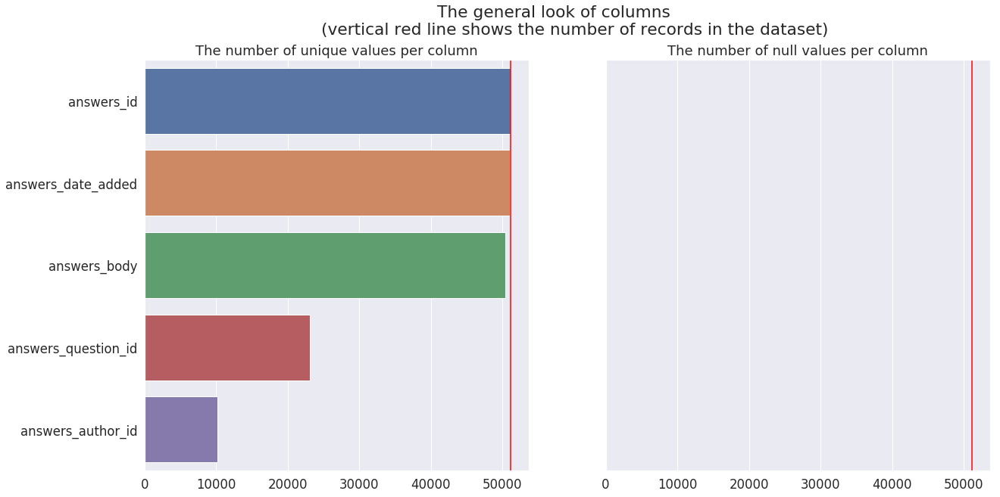

In [296]:
plot_null_and_unique_values(answers)

### <a id='819'>comments</a>

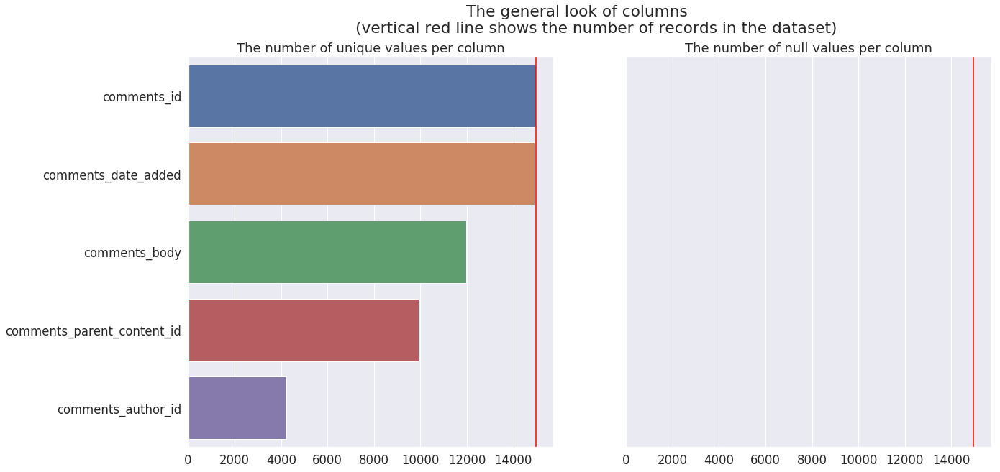

In [297]:
plot_null_and_unique_values(comments)

### <a id='8110'>matches</a>

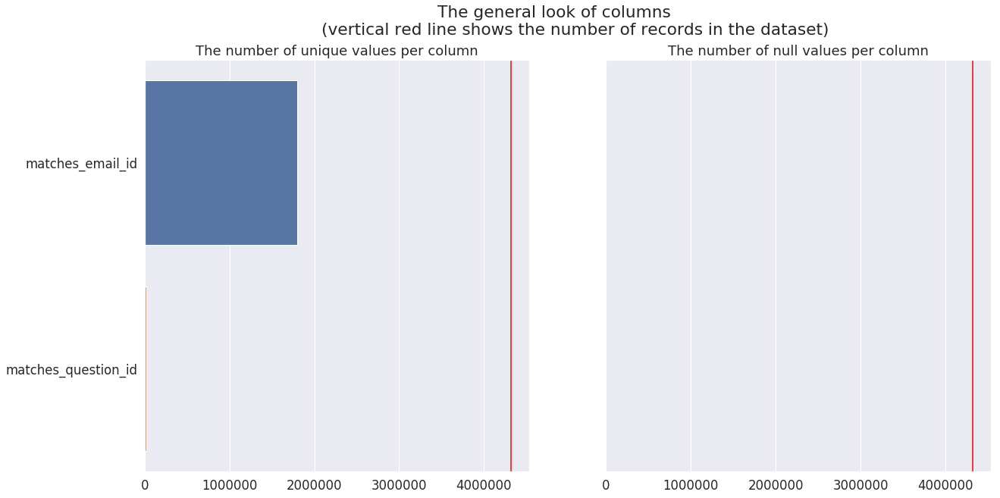

In [298]:
plot_null_and_unique_values(matches)

### <a id='8111'>tags</a>

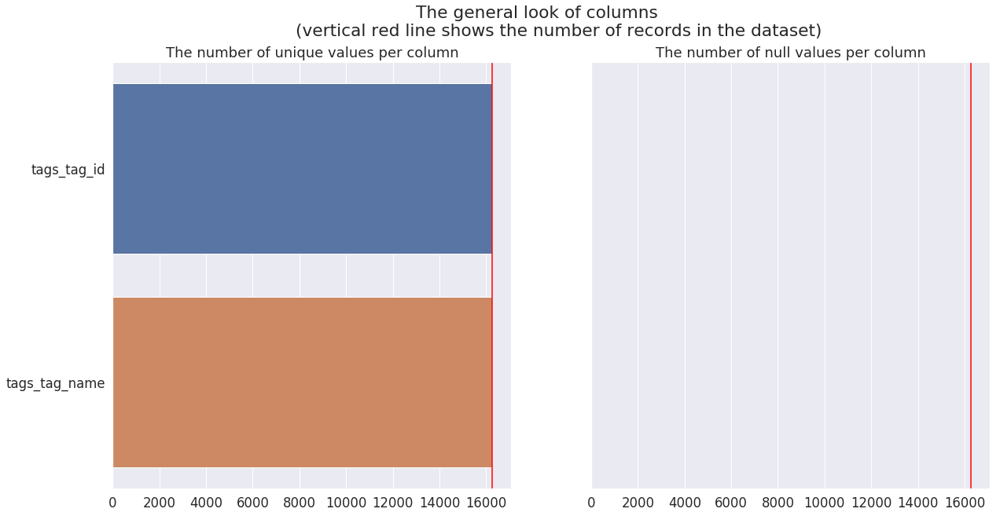

In [299]:
plot_null_and_unique_values(tags)

### <a id='8112'>questions</a>

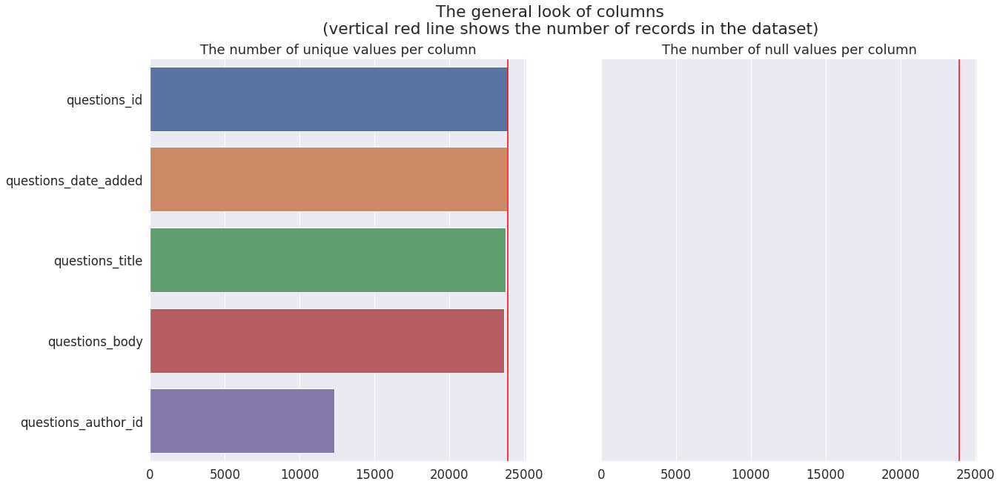

In [300]:
plot_null_and_unique_values(questions)

### <a id='8113'>school_memberships</a>

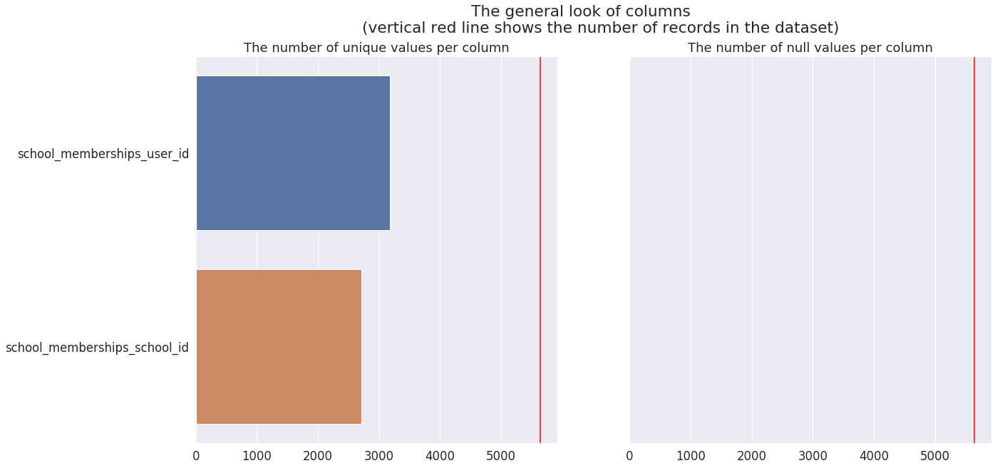

In [301]:
plot_null_and_unique_values(school_memberships)

## <a id='82'>What columns in what tables?</a>

In [0]:
tables_columns_info = get_meta_info_about_columns_and_tables(
    [
        professionals,
        tag_users,
        students,
        tag_questions,
        groups,
        emails,
        group_memberships,
        answers,
        comments,
        matches,
        tags,
        questions,
        school_memberships
    ],
    [
        'professionals',
        'tag_users',
        'students',
        'tag_questions',
        'groups',
        'emails',
        'group_memberships',
        'answers',
        'comments',
        'matches',
        'tags',
        'questions',
        'school_memberships'
    ]
)

In [303]:
tables_columns_info.head(10)

,table,column
0,professionals,professionals_id
1,professionals,professionals_location
2,professionals,professionals_industry
3,professionals,professionals_headline
4,professionals,professionals_date_joined
5,tag_users,tag_users_tag_id
6,tag_users,tag_users_user_id
7,students,students_id
8,students,students_location
9,students,students_date_joined


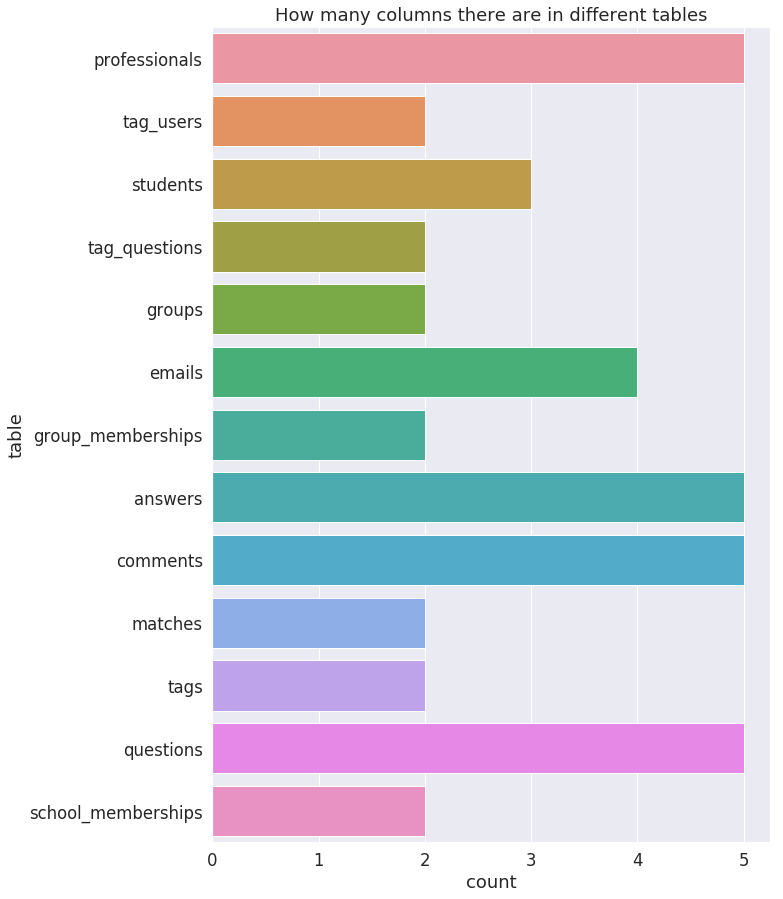

In [305]:
plt.figure(figsize=(10, 15))
sns.countplot(y=tables_columns_info.table)
plt.title('How many columns there are in different tables')
plt.show()

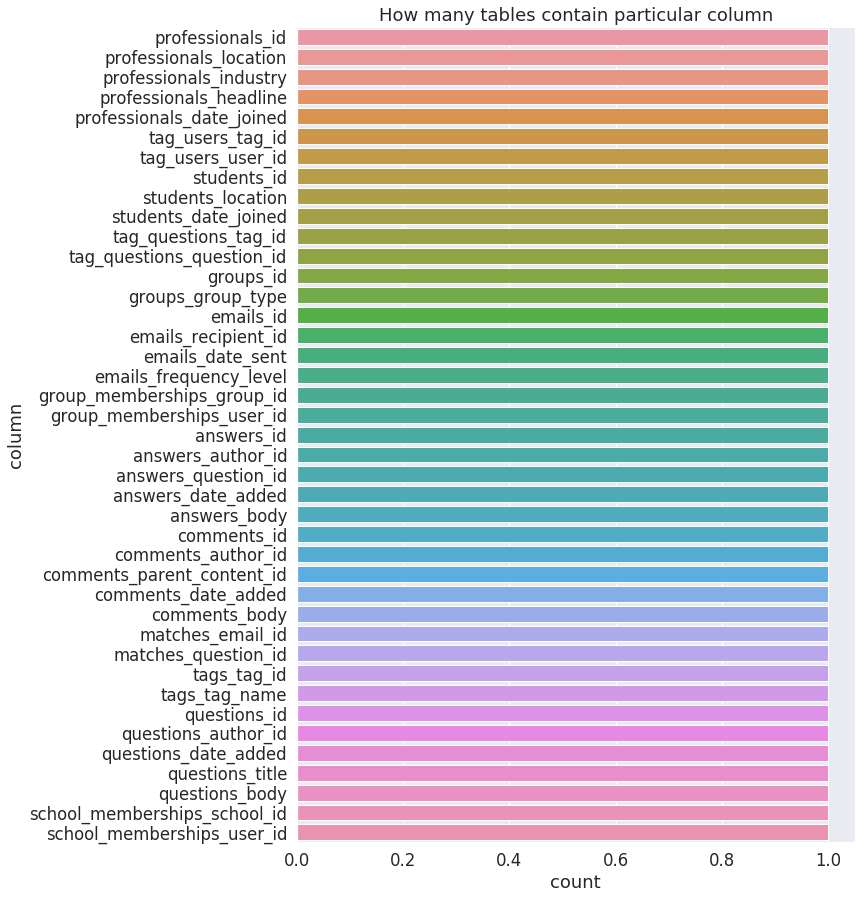

In [306]:
plt.figure(figsize=(10, 15))
sns.countplot(y=tables_columns_info.column)
plt.title('How many tables contain particular column')
plt.show()

In [307]:
tables_columns_info[tables_columns_info.column.str.contains('date')]

,table,column
4,professionals,professionals_date_joined
9,students,students_date_joined
16,emails,emails_date_sent
23,answers,answers_date_added
28,comments,comments_date_added
36,questions,questions_date_added


In [308]:
tables_columns_info[tables_columns_info.column.str.contains('_id')]

,table,column
0,professionals,professionals_id
5,tag_users,tag_users_tag_id
6,tag_users,tag_users_user_id
7,students,students_id
10,tag_questions,tag_questions_tag_id
11,tag_questions,tag_questions_question_id
12,groups,groups_id
14,emails,emails_id
15,emails,emails_recipient_id
18,group_memberships,group_memberships_group_id


As you have (most probably) guessed the name on each column starts with the name of the table that column belongs to.

This may be a bit confusing especially when we want to understand which tables can be merged together.

So let's remove this prefixes from column names and see how many columns will be in several tables:

In [0]:
remove_table_name_prefixes(
    [
        professionals,
        tag_users,
        students,
        tag_questions,
        groups,
        emails,
        group_memberships,
        answers,
        comments,
        matches,
        tags,
        questions,
        school_memberships
    ],
    [
        'professionals',
        'tag_users',
        'students',
        'tag_questions',
        'groups',
        'emails',
        'group_memberships',
        'answers',
        'comments',
        'matches',
        'tags',
        'questions',
        'school_memberships'
    ]
)

In [0]:
tables_columns_info = get_meta_info_about_columns_and_tables(
    [
        professionals,
        tag_users,
        students,
        tag_questions,
        groups,
        emails,
        group_memberships,
        answers,
        comments,
        matches,
        tags,
        questions,
        school_memberships
    ],
    [
        'professionals',
        'tag_users',
        'students',
        'tag_questions',
        'groups',
        'emails',
        'group_memberships',
        'answers',
        'comments',
        'matches',
        'tags',
        'questions',
        'school_memberships'
    ]
)

In [311]:
tables_columns_info.head(10)

,table,column
0,professionals,id
1,professionals,location
2,professionals,industry
3,professionals,headline
4,professionals,date_joined
5,tag_users,tag_id
6,tag_users,user_id
7,students,id
8,students,location
9,students,date_joined


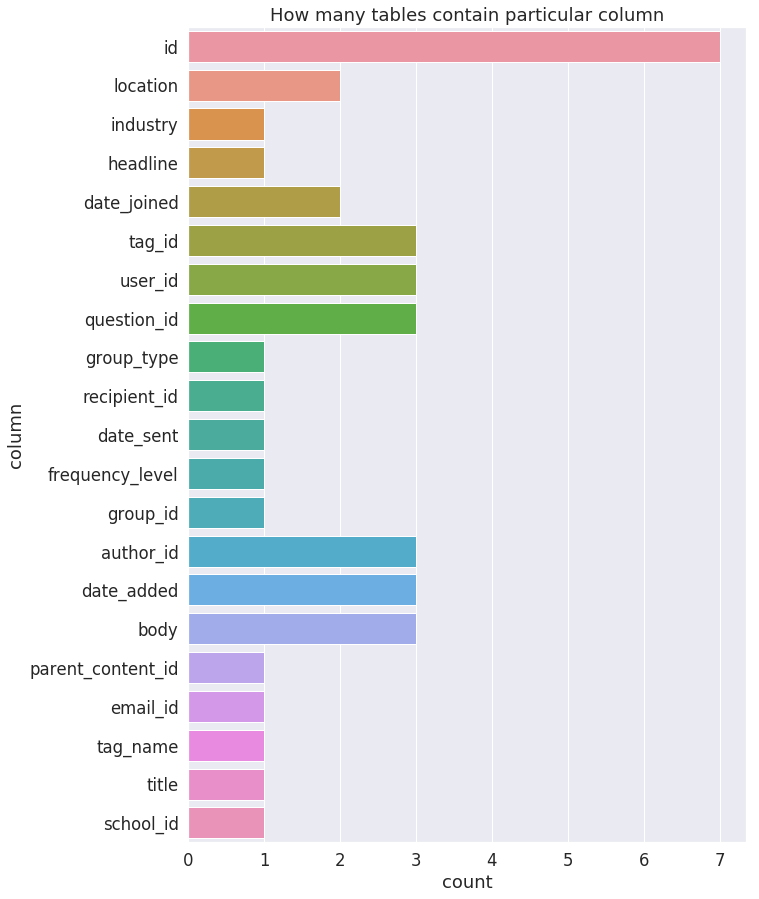

In [312]:
plt.figure(figsize=(10, 15))
sns.countplot(y=tables_columns_info.column)
plt.title('How many tables contain particular column')
plt.show()

Now we can see that there are some columns that can be used to merge tables and generate more sophisticated insights.

In [313]:
tables_columns_info[tables_columns_info.column.str.contains('id')].sort_values(by='table')

,table,column
20,answers,id
22,answers,question_id
21,answers,author_id
27,comments,parent_content_id
26,comments,author_id
25,comments,id
14,emails,id
15,emails,recipient_id
18,group_memberships,group_id
19,group_memberships,user_id


## <a id='83'>Tables mapping</a>

Okay, we've got lots of tables that can be merged together but the question is: how many rows of one table can be merged with rows from another table?

For example there can be:
- students that did not ask any question yet;
- professionals that did not answered any question yet;
- questions without any answers or comments;
- answers without any comments;
- questions without any tags;
- users without any tags;
- users without any group memberships;
- users without any school memberships.
- etc.

All these kinds of questions can give an understanding of the users activity.

### <a id='831'>Students intersected with Questions by author_id</a>

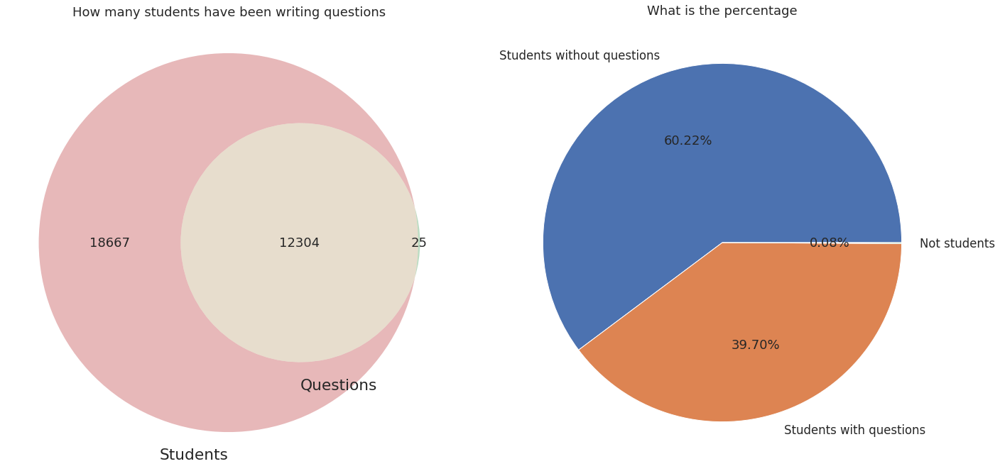

In [314]:
plot_intersections(
    students,
    questions,
    'id',
    'author_id',
    'Students',
    'Questions',
    'How many students have been writing questions',
    'Students without questions',
    'Students with questions',
    'Not students',
    'What is the percentage'
)

### <a id='832'>Professionals intersected with Questions by author_id</a>

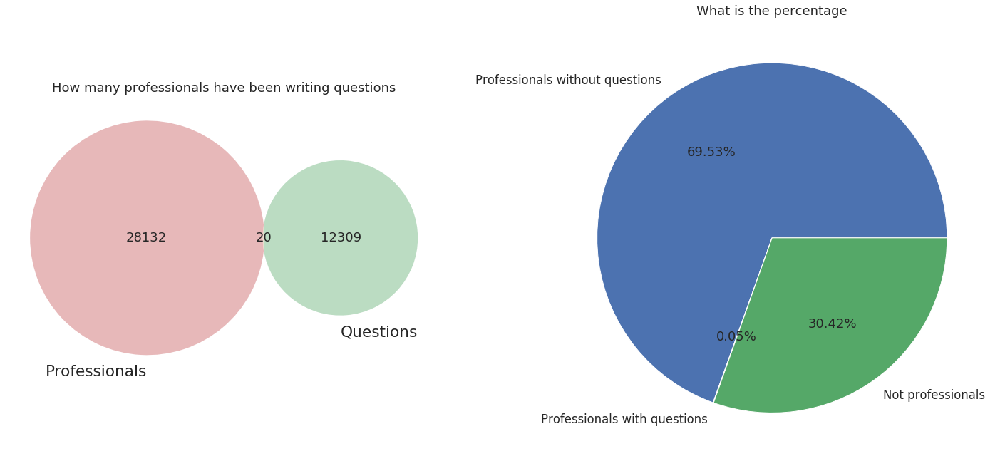

In [315]:
plot_intersections(
    professionals,
    questions,
    'id',
    'author_id',
    'Professionals',
    'Questions',
    'How many professionals have been writing questions',
    'Professionals without questions',
    'Professionals with questions',
    'Not professionals',
    'What is the percentage'
)

Hmm... There are some questions that were asked neither by students nor professionals.

How many?

In [316]:
print('Number of questions asked neither by professionals nor students: ', len(questions[
    questions.author_id.isin(
        set(questions.author_id) - (set(students.id) | set(professionals.id))
    )
]))

Number of questions asked neither by professionals nor students:  47


### <a id='833'>Professionals intersected with Answers by author_id</a>

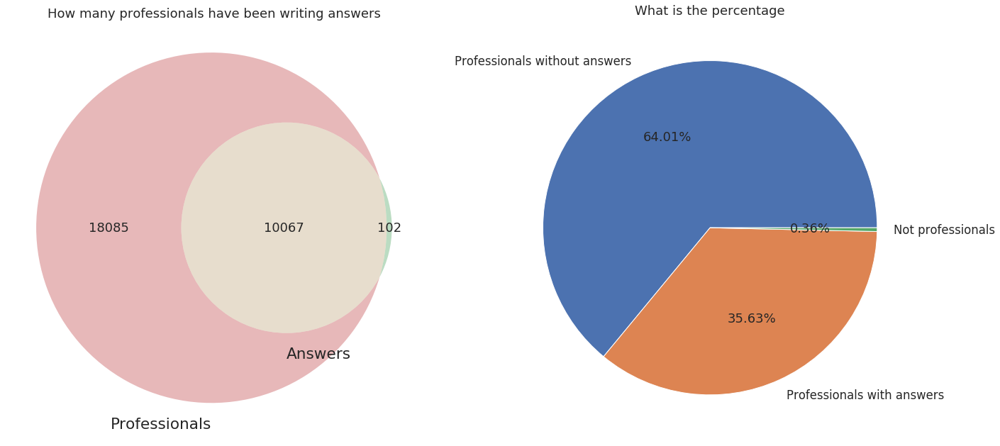

In [317]:
plot_intersections(
    professionals,
    answers,
    'id',
    'author_id',
    'Professionals',
    'Answers',
    'How many professionals have been writing answers',
    'Professionals without answers',
    'Professionals with answers',
    'Not professionals',
    'What is the percentage'
)

### <a id='834'>Students intersected with Answers by author_id</a>

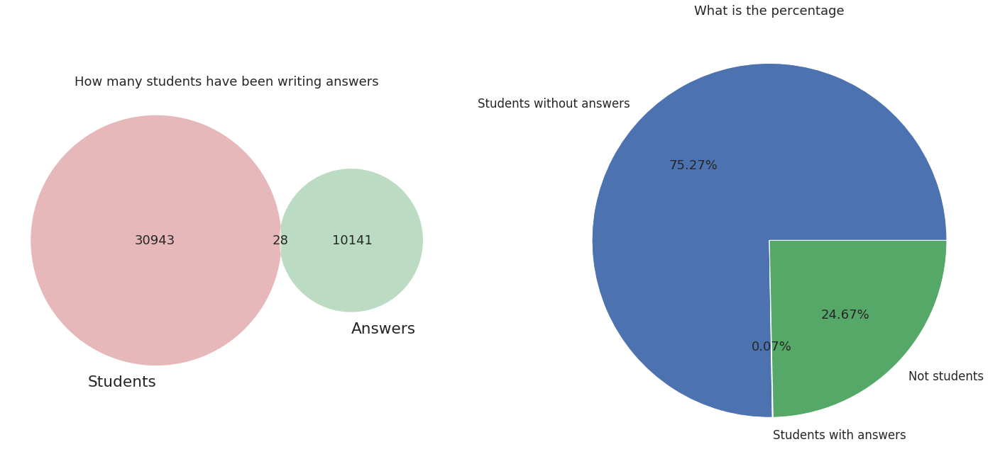

In [318]:
plot_intersections(
    students,
    answers,
    'id',
    'author_id',
    'Students',
    'Answers',
    'How many students have been writing answers',
    'Students without answers',
    'Students with answers',
    'Not students',
    'What is the percentage'
)

And it looks like there are answers that were written neither by professionals nor students:

In [319]:
print('Number of answers written neither by professionals nor students: ', len(answers[
    answers.author_id.isin(
        set(answers.author_id) - (set(students.id) | set(professionals.id))
    )
]))

Number of answers written neither by professionals nor students:  971


Okay, what about questions?

How many questions stayed unanswered?

### <a id='835'>Questions intersected with Answers by question_id</a>

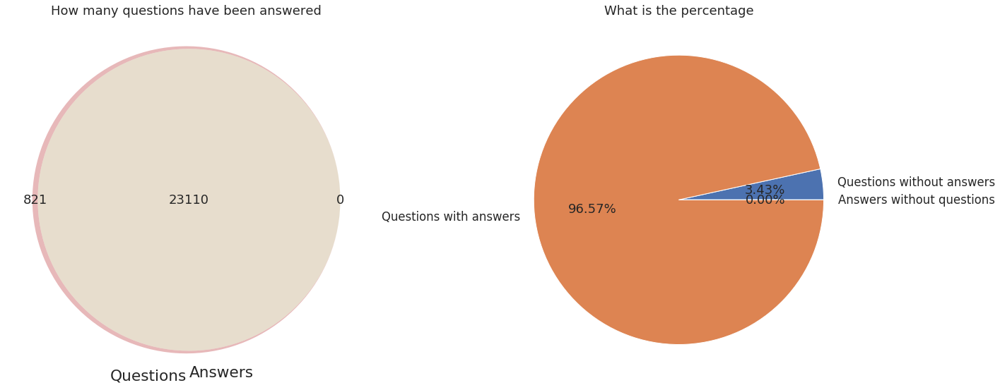

In [320]:
plot_intersections(
    questions,
    answers,
    'id',
    'question_id',
    'Questions',
    'Answers',
    'How many questions have been answered',
    'Questions without answers',
    'Questions with answers',
    'Answers without questions',
    'What is the percentage'
)

821 questions stayed unanswered.

Not good but at least we don't have answers without questions)))

Now let's look at comments

### <a id='836'>Questions intersected with Comments by question_id</a>

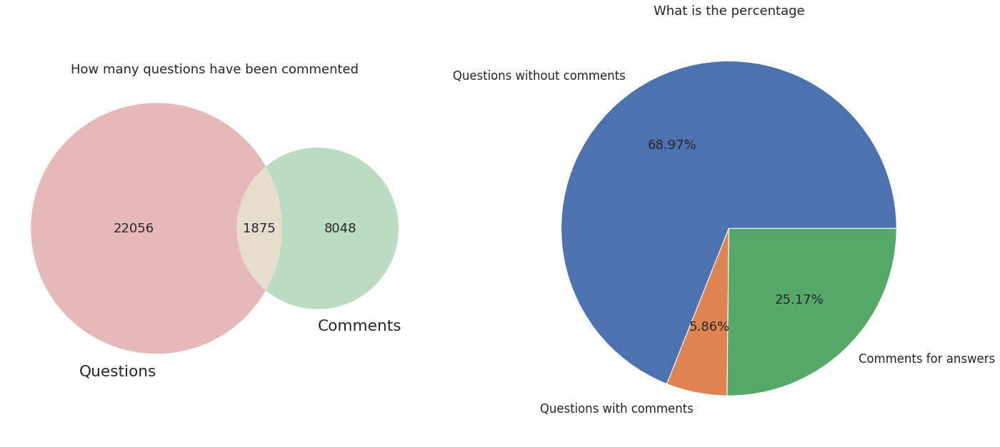

In [321]:
plot_intersections(
    questions,
    comments,
    'id',
    'parent_content_id',
    'Questions',
    'Comments',
    'How many questions have been commented',
    'Questions without comments',
    'Questions with comments',
    'Comments for answers',
    'What is the percentage'
)

Okay, 1875 questions have been commented.

What about answers?

### <a id='837'>Answers intersected with Comments by answer_id</a>

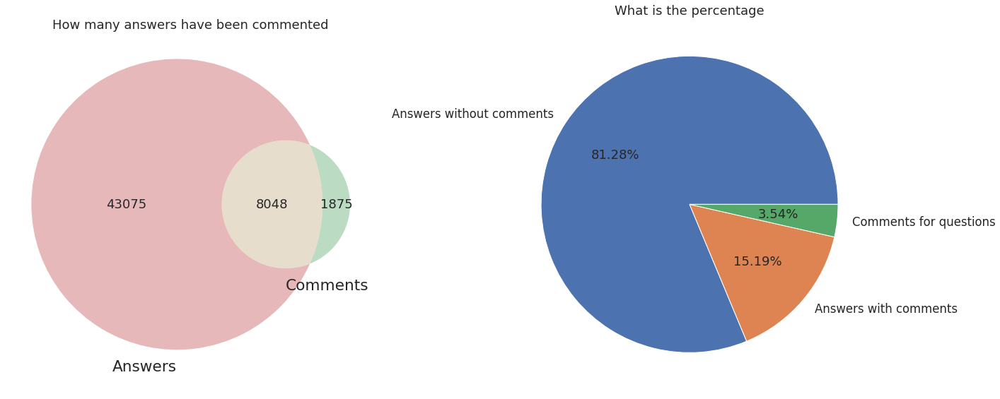

In [322]:
plot_intersections(
    answers,
    comments,
    'id',
    'parent_content_id',
    'Answers',
    'Comments',
    'How many answers have been commented',
    'Answers without comments',
    'Answers with comments',
    'Comments for questions',
    'What is the percentage'
)

In [323]:
print(
    'Number of comments written neither for answers nor for questions: ',
    len(set(comments.parent_content_id) - (set(answers.id) | set(questions.id)))
)

Number of comments written neither for answers nor for questions:  0


Well at least we do not have comments that would not be related neither to questions no answers.

Yep, by the way, who writes these comments?

### <a id='838'>Professionals intersected with Comments by author_id</a>

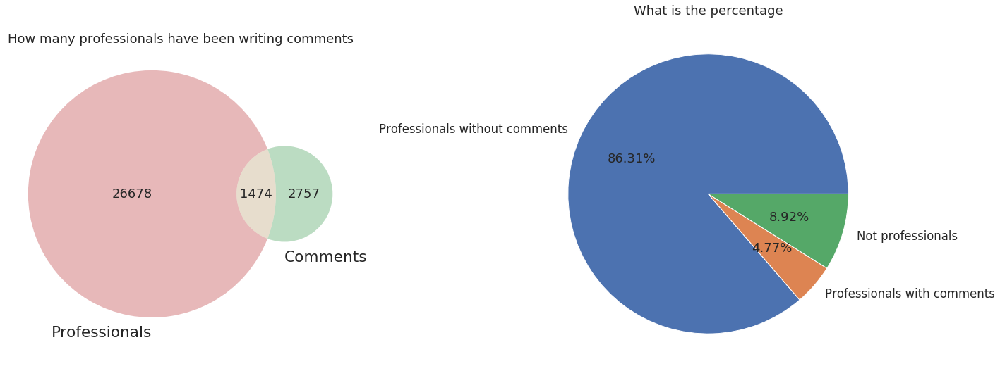

In [324]:
plot_intersections(
    professionals,
    comments,
    'id',
    'author_id',
    'Professionals',
    'Comments',
    'How many professionals have been writing comments',
    'Professionals without comments',
    'Professionals with comments',
    'Not professionals',
    'What is the percentage'
)

In [325]:
print(
    'Number of comments written by professionals: ',
    len(comments[comments.author_id.isin(set(professionals.id))])
)

Number of comments written by professionals:  3395


### <a id='839'>Students intersected with Comments by author_id</a>

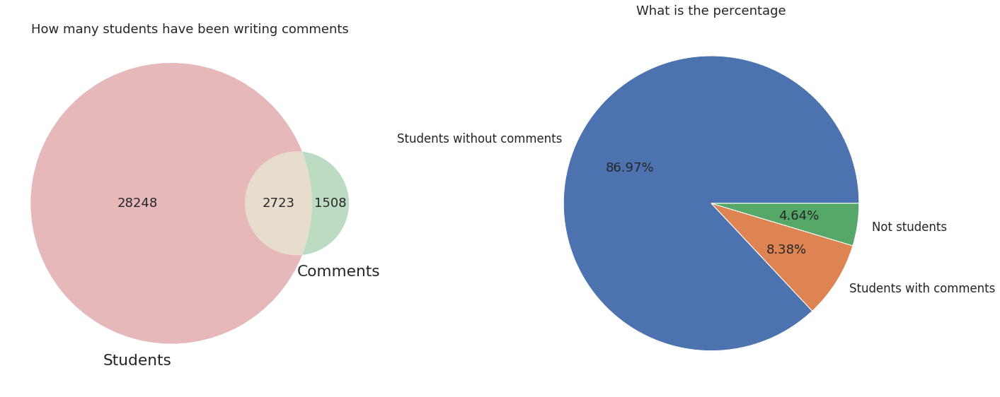

In [326]:
plot_intersections(
    students,
    comments,
    'id',
    'author_id',
    'Students',
    'Comments',
    'How many students have been writing comments',
    'Students without comments',
    'Students with comments',
    'Not students',
    'What is the percentage'
)

In [327]:
print(
    'Number of comments written by students: ',
    len(comments[comments.author_id.isin(set(students.id))])
)

Number of comments written by students:  10962


So students much more active in commenting which seems quite logical.

### <a id='8310'>Students intersected with Group_memberships by user_id</a>

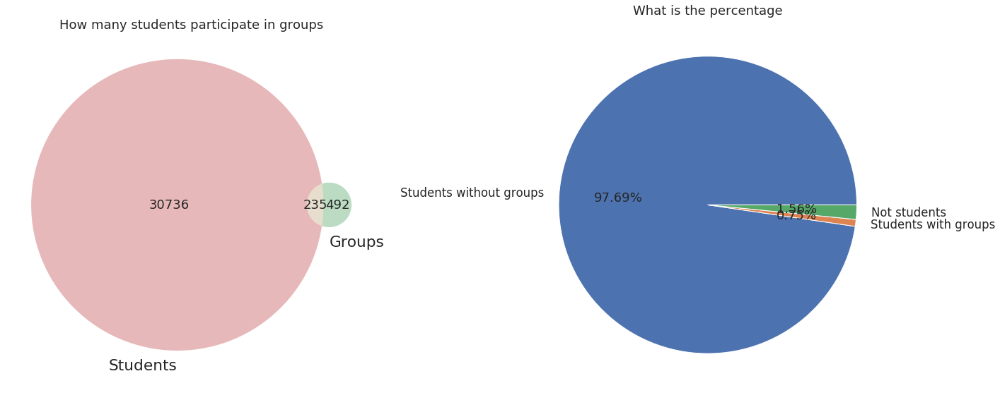

In [328]:
plot_intersections(
    students,
    group_memberships,
    'id',
    'user_id',
    'Students',
    'Groups',
    'How many students participate in groups',
    'Students without groups',
    'Students with groups',
    'Not students',
    'What is the percentage'
)

### <a id='8311'>Professionals intersected with Group_memberships by user_id</a>

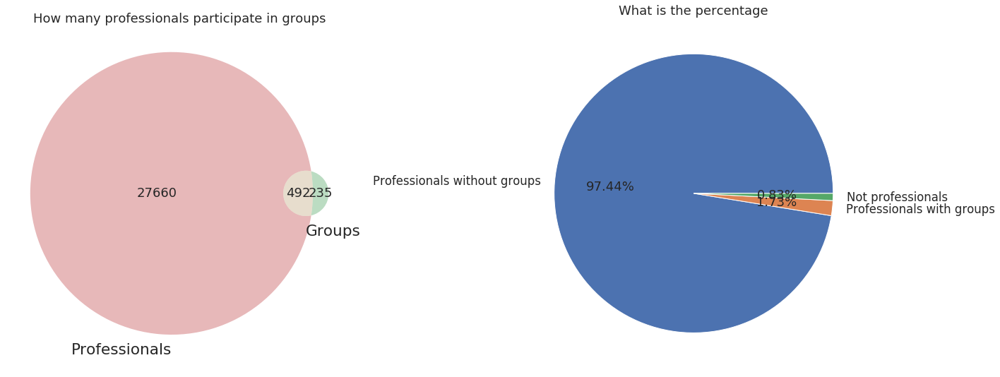

In [329]:
plot_intersections(
    professionals,
    group_memberships,
    'id',
    'user_id',
    'Professionals',
    'Groups',
    'How many professionals participate in groups',
    'Professionals without groups',
    'Professionals with groups',
    'Not professionals',
    'What is the percentage'
)

In [330]:
print(
    'Number of group members which are neither students nor professionals: ',
    len(set(group_memberships.user_id) - (set(students.id) | set(professionals.id)))
)

Number of group members which are neither students nor professionals:  0


### <a id='8312'>Students intersected with School_memberships by user_id</a>

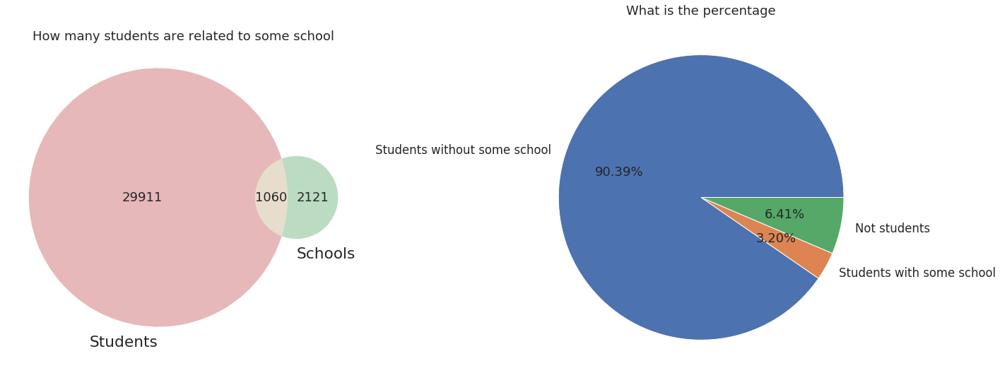

In [331]:
plot_intersections(
    students,
    school_memberships,
    'id',
    'user_id',
    'Students',
    'Schools',
    'How many students are related to some school',
    'Students without some school',
    'Students with some school',
    'Not students',
    'What is the percentage'
)

### <a id='8313'>Professionals intersected with School_memberships by user_id</a>

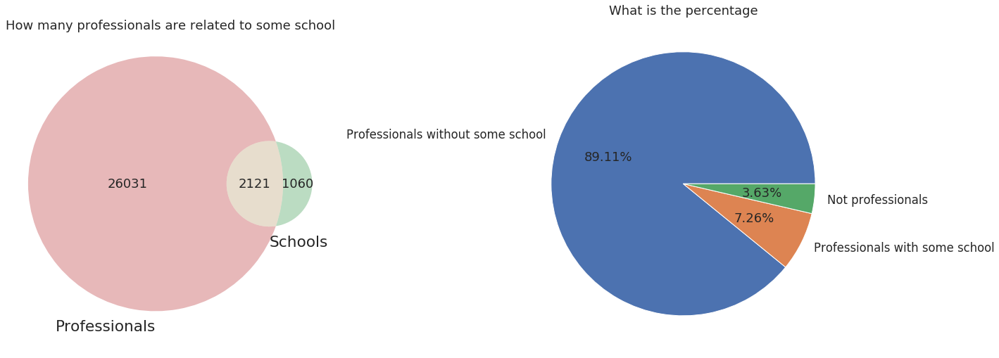

In [332]:
plot_intersections(
    professionals,
    school_memberships,
    'id',
    'user_id',
    'Professionals',
    'Schools',
    'How many professionals are related to some school',
    'Professionals without some school',
    'Professionals with some school',
    'Not professionals',
    'What is the percentage'
)

In [333]:
print(
    'Number of school members which are neither students nor professionals: ',
    len(set(school_memberships.user_id) - (set(students.id) | set(professionals.id)))
)

Number of school members which are neither students nor professionals:  0


As we can see professionals are more active in various groups participation.

### <a id='8314'>Students intersected with Tag_users by user_id</a>

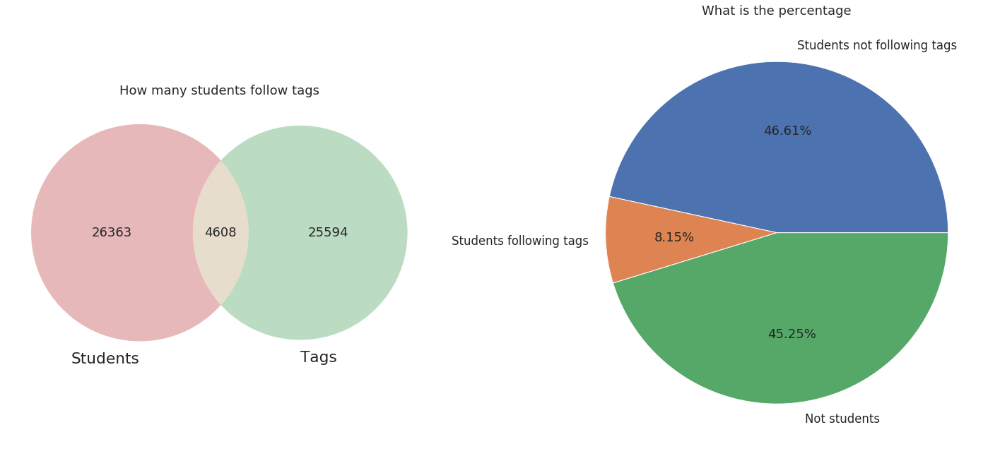

In [334]:
plot_intersections(
    students,
    tag_users,
    'id',
    'user_id',
    'Students',
    'Tags',
    'How many students follow tags',
    'Students not following tags',
    'Students following tags',
    'Not students',
    'What is the percentage'
)

### <a id='8315'>Professionals intersected with Tag_users by user_id</a>

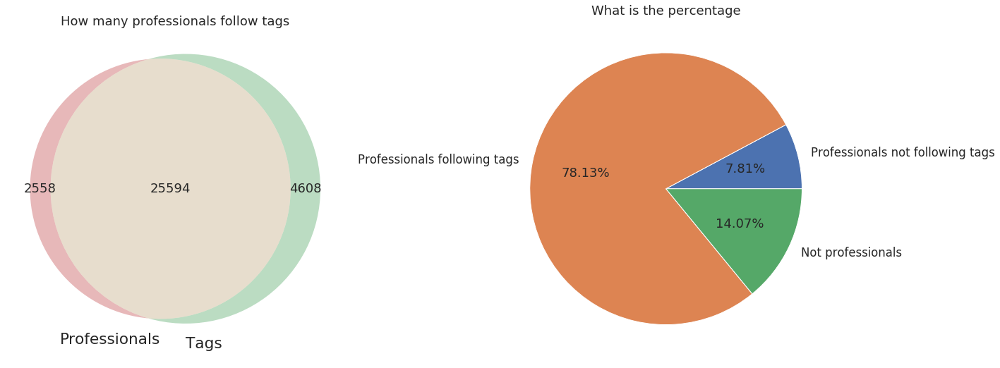

In [335]:
plot_intersections(
    professionals,
    tag_users,
    'id',
    'user_id',
    'Professionals',
    'Tags',
    'How many professionals follow tags',
    'Professionals not following tags',
    'Professionals following tags',
    'Not professionals',
    'What is the percentage'
)

In [336]:
print(
    'Number of tags that were given neither to students nor professionals: ',
    len(set(tag_users.user_id) - (set(students.id) | set(professionals.id)))
)

Number of tags that were given neither to students nor professionals:  0


### <a id='8316'>Questions intersected with Tag_questions by question_id</a>

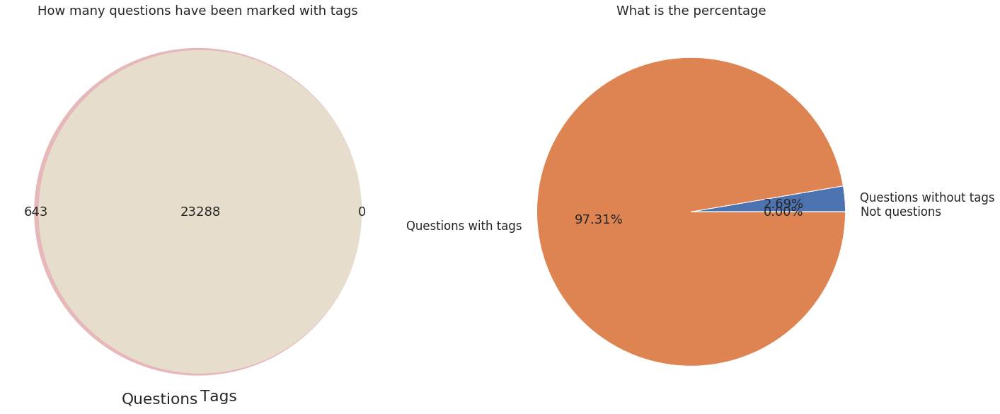

In [337]:
plot_intersections(
    questions,
    tag_questions,
    'id',
    'question_id',
    'Questions',
    'Tags',
    'How many questions have been marked with tags',
    'Questions without tags',
    'Questions with tags',
    'Not questions',
    'What is the percentage'
)

### <a id='8317'>Students intersected with Emails by recipient_id</a>

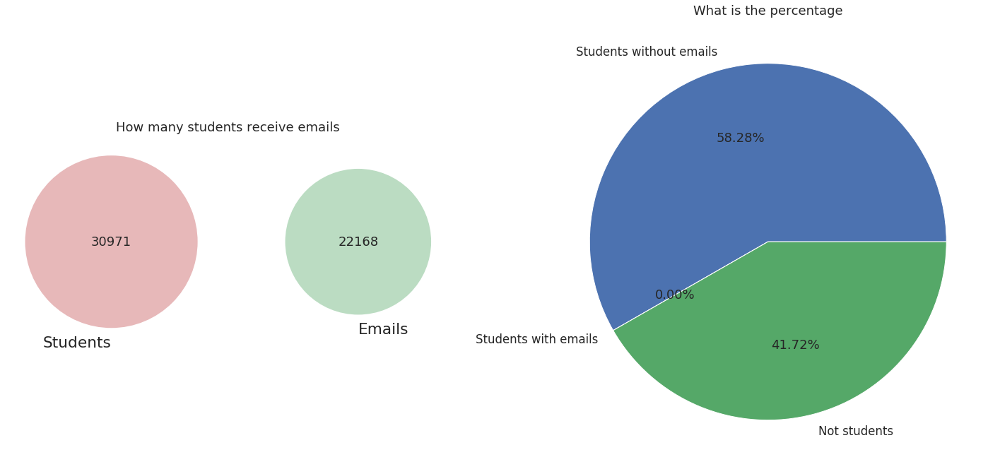

In [338]:
plot_intersections(
    students,
    emails,
    'id',
    'recipient_id',
    'Students',
    'Emails',
    'How many students receive emails',
    'Students without emails',
    'Students with emails',
    'Not students',
    'What is the percentage'
)

### <a id='8318'>Professionals intersected with Emails by recipient_id</a>

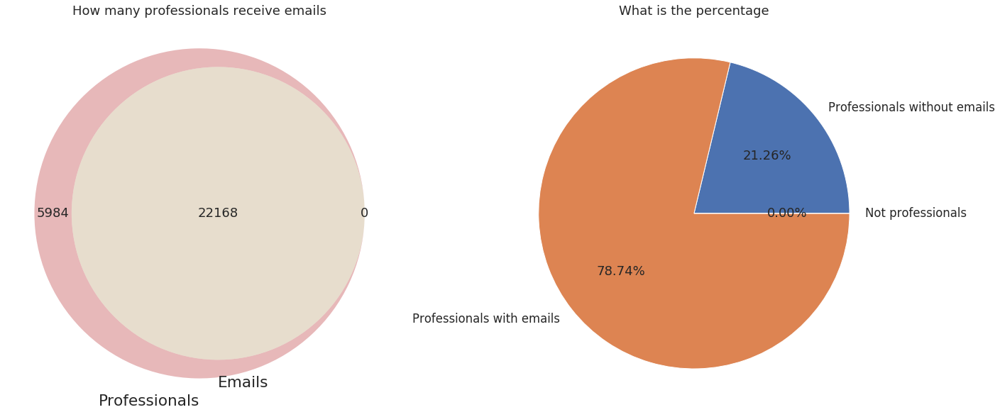

In [339]:
plot_intersections(
    professionals,
    emails,
    'id',
    'recipient_id',
    'Professionals',
    'Emails',
    'How many professionals receive emails',
    'Professionals without emails',
    'Professionals with emails',
    'Not professionals',
    'What is the percentage'
)

### <a id='8319'>Emails intersected with Matches by email_id</a>

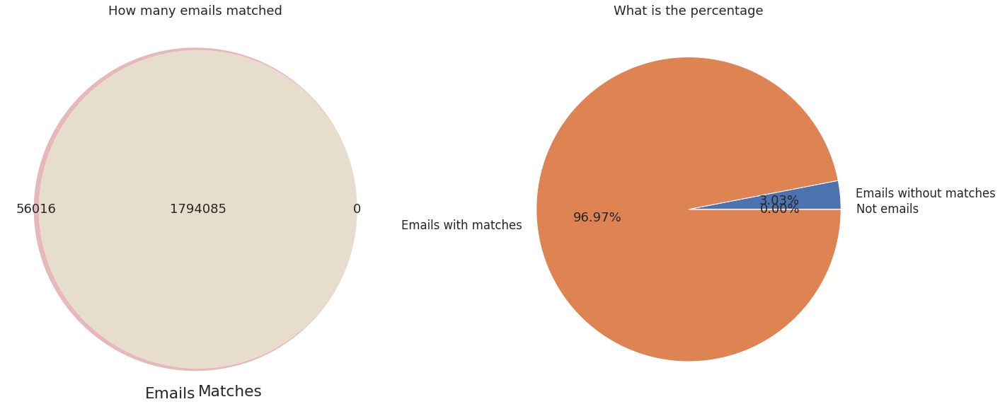

In [340]:
plot_intersections(
    emails,
    matches,
    'id',
    'email_id',
    'Emails',
    'Matches',
    'How many emails matched',
    'Emails without matches',
    'Emails with matches',
    'Not emails',
    'What is the percentage'
)

### <a id='8320'>Questions intersected with Matches by question_id</a>

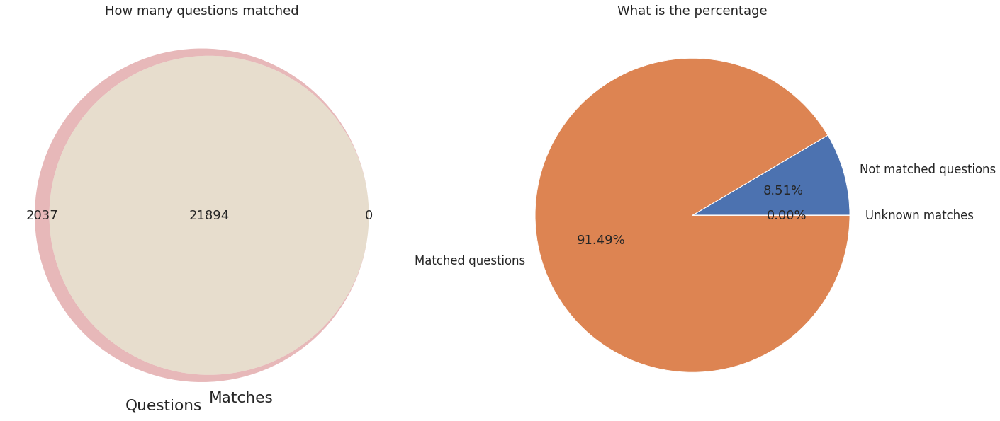

In [341]:
plot_intersections(
    questions,
    matches,
    'id',
    'question_id',
    'Questions',
    'Matches',
    'How many questions matched',
    'Not matched questions',
    'Matched questions',
    'Unknown matches',
    'What is the percentage'
)

## <a id='84'>ER-diagram of data</a>

Here is the result of the preliminary EDA.

It will probably help to understand the nature of the data.

In [0]:
from google.colab import drive
drive.mount('/content/gdrive')

In [346]:
! ls -alh /content/gdrive/My\ Drive/DS_COURSE/MODULE_2/EDA

total 11M
-rw------- 1 root root 7.9M Jun 18 15:55 CLASSWORK.ipynb
-rw------- 1 root root 186K Jun 25 11:56 EntityRelationshipDiagramExample.jpeg
-rw------- 1 root root 3.0M Jun 25 12:56 HOMEWORK.ipynb


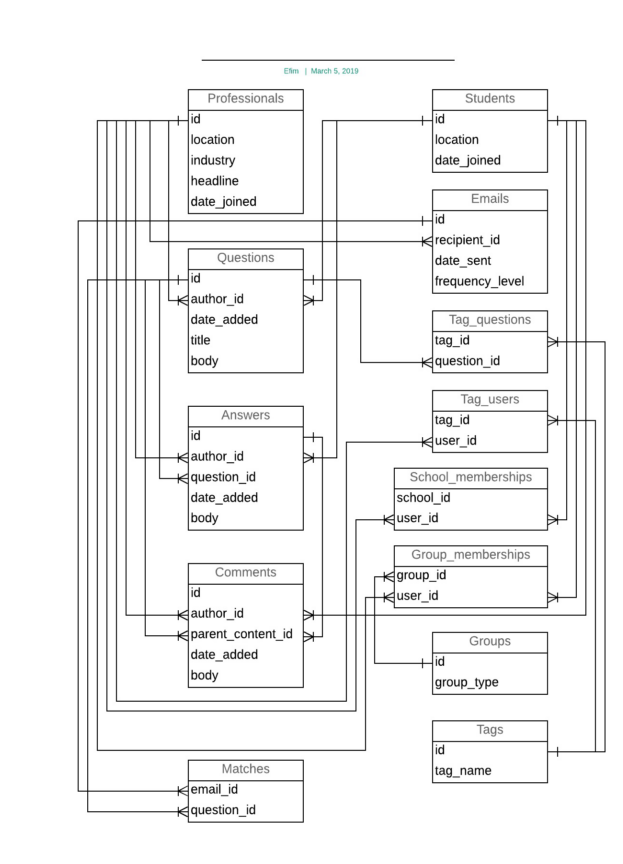

In [347]:
plt.figure(figsize=(10, 15))
plt.imshow(mpimg.imread("/content/gdrive/My Drive/DS_COURSE/MODULE_2/EDA/EntityRelationshipDiagramExample.jpeg"), interpolation='bilinear', aspect='auto')
plt.axis("off")
plt.show()

# <a id='9'>Deeper analysis</a>

<img src="https://i.kym-cdn.com/photos/images/newsfeed/000/531/557/a88.jpg" width="500"></img>

Yep, after some data quality analysis we can go deeper and try to collect more information about the domain.

For example, if we work with time series we can plot the dynamic of, say:
- professionals or students community growth (yearly, monthly, meekly, daily, hourly);
- community growth in certain professional area;
- question/answer/comment dynamic (how many unanswered/uncommented do we have? Is this number increasing/decreasing/stays the same over time?).

In [348]:
tables_columns_info[tables_columns_info.column.str.contains('date')]

,table,column
4,professionals,date_joined
9,students,date_joined
16,emails,date_sent
23,answers,date_added
28,comments,date_added
36,questions,date_added


In [0]:
extract_year_month_week_day_hour(professionals, 'date_joined')

In [0]:
extract_year_month_week_day_hour(students, 'date_joined')

In [0]:
extract_year_month_week_day_hour(emails, 'date_sent')

In [0]:
extract_year_month_week_day_hour(answers, 'date_added')

In [0]:
extract_year_month_week_day_hour(comments, 'date_added')

In [0]:
extract_year_month_week_day_hour(questions, 'date_added')

In [357]:
print('Professionals year range is: ', professionals.year.min(), professionals.year.max())
print('Students year range is: ', students.year.min(), students.year.max())
print('Emails year range is: ', emails.year.min(), emails.year.max())
print('Answers year range is: ', answers.year.min(), answers.year.max())
print('Comments year range is: ', comments.year.min(), comments.year.max())
print('Questions year range is: ', questions.year.min(), questions.year.max())

Professionals year range is:  2011 2019
Students year range is:  2011 2019
Emails year range is:  2013 2019
Answers year range is:  2011 2019
Comments year range is:  2011 2019
Questions year range is:  2011 2019


In [358]:
print('Professionals month range is: ', professionals.month.min(), professionals.month.max())
print('Students month range is: ', students.month.min(), students.month.max())
print('Emails month range is: ', emails.month.min(), emails.month.max())
print('Answers month range is: ', answers.month.min(), answers.month.max())
print('Comments month range is: ', comments.month.min(), comments.month.max())
print('Questions month range is: ', questions.month.min(), questions.month.max())

Professionals month range is:  1 12
Students month range is:  1 12
Emails month range is:  1 12
Answers month range is:  1 12
Comments month range is:  1 12
Questions month range is:  1 12


In [359]:
print('Professionals week range is: ', professionals.week.min(), professionals.week.max())
print('Students week range is: ', students.week.min(), students.week.max())
print('Emails week range is: ', emails.week.min(), emails.week.max())
print('Answers week range is: ', answers.week.min(), answers.week.max())
print('Comments week range is: ', comments.week.min(), comments.week.max())
print('Questions week range is: ', questions.week.min(), questions.week.max())

Professionals week range is:  1 53
Students week range is:  1 53
Emails week range is:  1 53
Answers week range is:  1 53
Comments week range is:  1 53
Questions week range is:  1 53


In [360]:
print('Professionals day range is: ', professionals.day.min(), professionals.day.max())
print('Students day range is: ', students.day.min(), students.day.max())
print('Emails day range is: ', emails.day.min(), emails.day.max())
print('Answers day range is: ', answers.day.min(), answers.day.max())
print('Comments day range is: ', comments.day.min(), comments.day.max())
print('Questions day range is: ', questions.day.min(), questions.day.max())

Professionals day range is:  1 31
Students day range is:  1 31
Emails day range is:  1 31
Answers day range is:  1 31
Comments day range is:  1 31
Questions day range is:  1 31


In [361]:
print('Professionals hour range is: ', professionals.hour.min(), professionals.hour.max())
print('Students hour range is: ', students.hour.min(), students.hour.max())
print('Emails hour range is: ', emails.hour.min(), emails.hour.max())
print('Answers hour range is: ', answers.hour.min(), answers.hour.max())
print('Comments hour range is: ', comments.hour.min(), comments.hour.max())
print('Questions hour range is: ', questions.hour.min(), questions.hour.max())

Professionals hour range is:  0 23
Students hour range is:  0 23
Emails hour range is:  0 23
Answers hour range is:  0 23
Comments hour range is:  0 23
Questions hour range is:  0 23


## <a id='91'>Cumulative community growth</a>


### <a id='911'>Yearly</a>

In [0]:
professionals_yearly_cumcount = calculate_yearly_cumsum(professionals, 'professionals')
students_yearly_cumcount = calculate_yearly_cumsum(students, 'students')

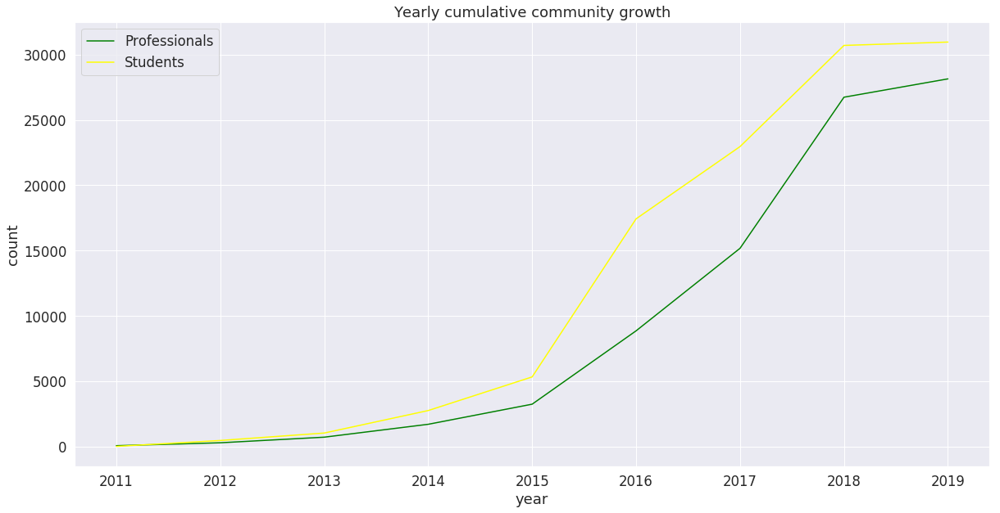

In [363]:
plt.figure(figsize=(20, 10))
plt.plot(professionals_yearly_cumcount, label='Professionals', color='green')
plt.plot(students_yearly_cumcount, label='Students', color='yellow')
plt.xlabel('year')
plt.ylabel('count')
plt.title('Yearly cumulative community growth')
plt.legend()
plt.show()

### <a id='912'>Monthly</a>

In [0]:
professionals_monthly_cumcount = calculate_monthly_cumsum(professionals, 'professionals')
students_monthly_cumcount = calculate_monthly_cumsum(students, 'students')

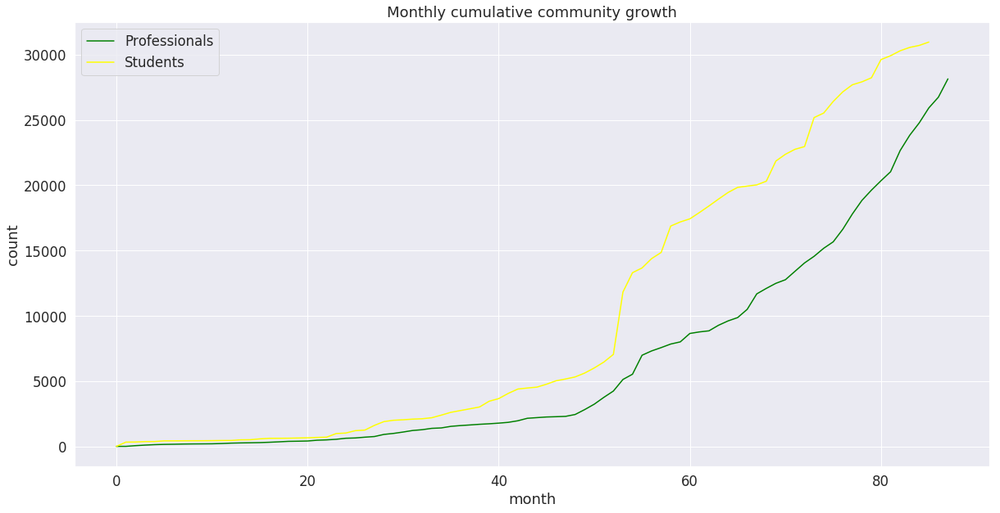

In [365]:
plt.figure(figsize=(20, 10))
plt.plot(professionals_monthly_cumcount.professionals_count, label='Professionals', color='green')
plt.plot(students_monthly_cumcount.students_count, label='Students', color='yellow')
plt.xlabel('month')
plt.ylabel('count')
plt.title('Monthly cumulative community growth')
plt.legend()
plt.show()

### <a id='913'>Weekly</a>

In [0]:
professionals_weekly_cumcount = calculate_weekly_cumsum(professionals, 'professionals')
students_weekly_cumcount = calculate_weekly_cumsum(students, 'students')

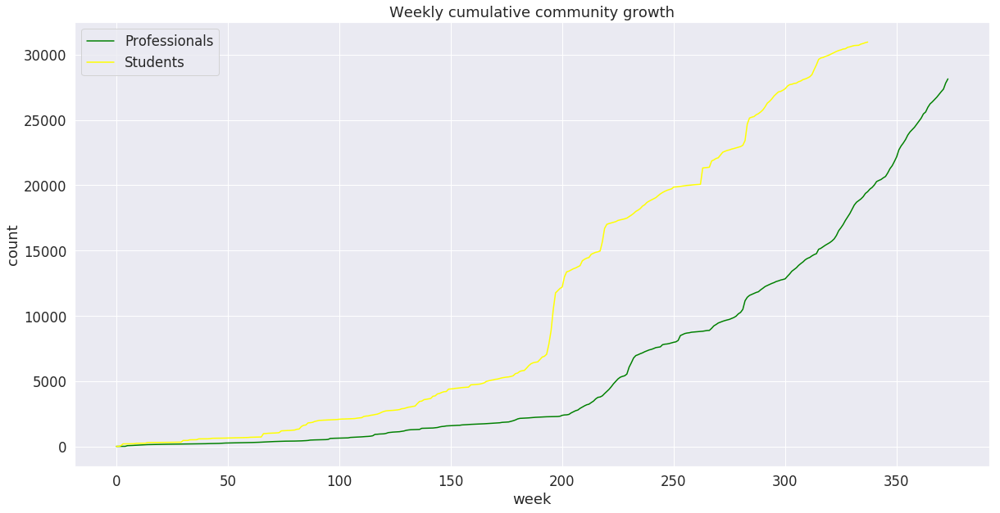

In [367]:
plt.figure(figsize=(20, 10))
plt.plot(professionals_weekly_cumcount.professionals_count, label='Professionals', color='green')
plt.plot(students_weekly_cumcount.students_count, label='Students', color='yellow')
plt.xlabel('week')
plt.ylabel('count')
plt.title('Weekly cumulative community growth')
plt.legend()
plt.show()

### <a id='914'>Daily</a>

In [0]:
professionals_daily_cumcount = calculate_daily_cumsum(professionals, 'professionals')
students_daily_cumcount = calculate_daily_cumsum(students, 'students')

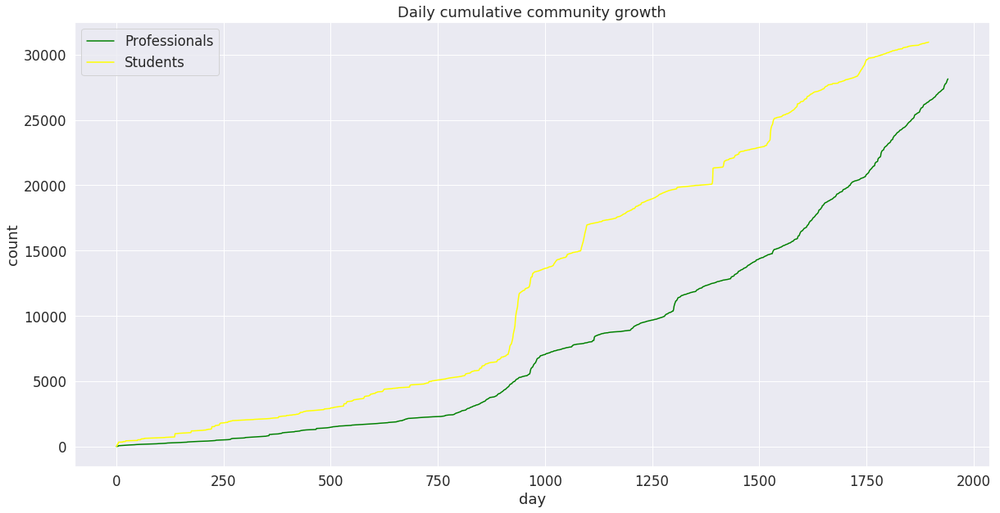

In [369]:
plt.figure(figsize=(20, 10))
plt.plot(professionals_daily_cumcount.professionals_count, label='Professionals', color='green')
plt.plot(students_daily_cumcount.students_count, label='Students', color='yellow')
plt.xlabel('day')
plt.ylabel('count')
plt.title('Daily cumulative community growth')
plt.legend()
plt.show()

## <a id='92'>Community growth dynamic</a>

### <a id='921'>Yearly</a>

In [0]:
professionals_yearly_count = calculate_yearly_count(professionals, 'professionals')
students_yearly_count = calculate_yearly_count(students, 'students')

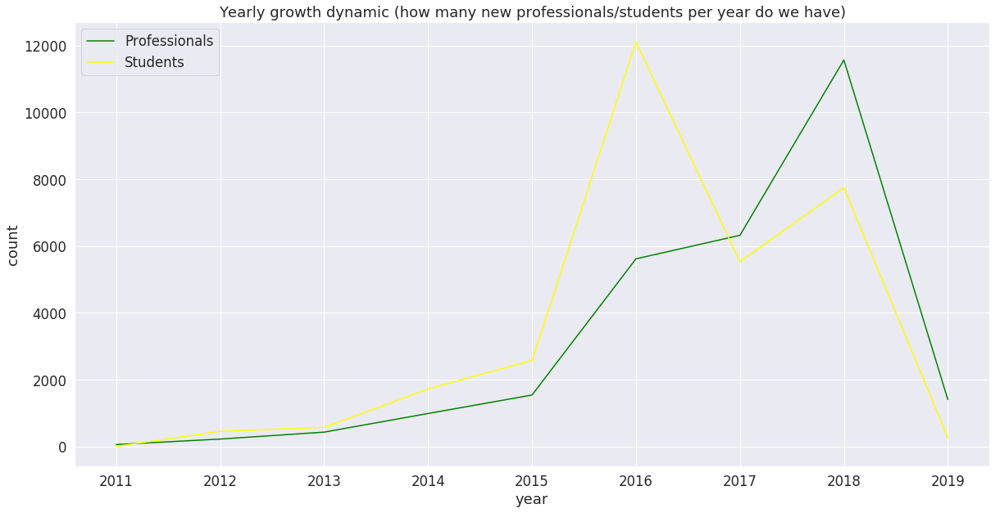

In [371]:
plt.figure(figsize=(20, 10))
plt.plot(professionals_yearly_count, label='Professionals', color='green')
plt.plot(students_yearly_count, label='Students', color='yellow')
plt.xlabel('year')
plt.ylabel('count')
plt.title('Yearly growth dynamic (how many new professionals/students per year do we have)')
plt.legend()
plt.show()

### <a id='922'>Monthly</a>

In [0]:
professionals_monthly_count = calculate_monthly_count(professionals, 'professionals')
students_monthly_count = calculate_monthly_count(students, 'students')

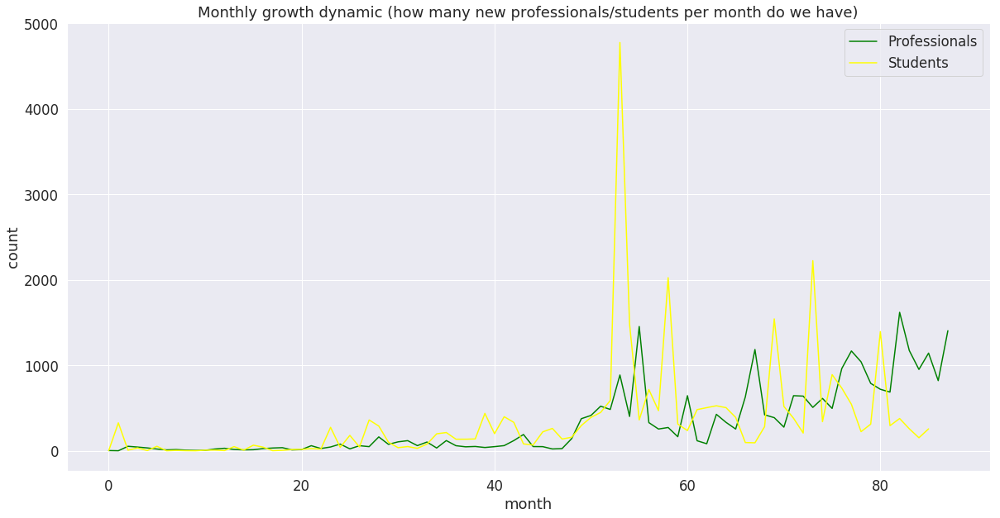

In [373]:
plt.figure(figsize=(20, 10))
plt.plot(professionals_monthly_count.professionals_count, label='Professionals', color='green')
plt.plot(students_monthly_count.students_count, label='Students', color='yellow')
plt.xlabel('month')
plt.ylabel('count')
plt.title('Monthly growth dynamic (how many new professionals/students per month do we have)')
plt.legend()
plt.show()

### <a id='923'>Weekly</a>

In [0]:
professionals_weekly_count = calculate_weekly_count(professionals, 'professionals')
students_weekly_count = calculate_weekly_count(students, 'students')

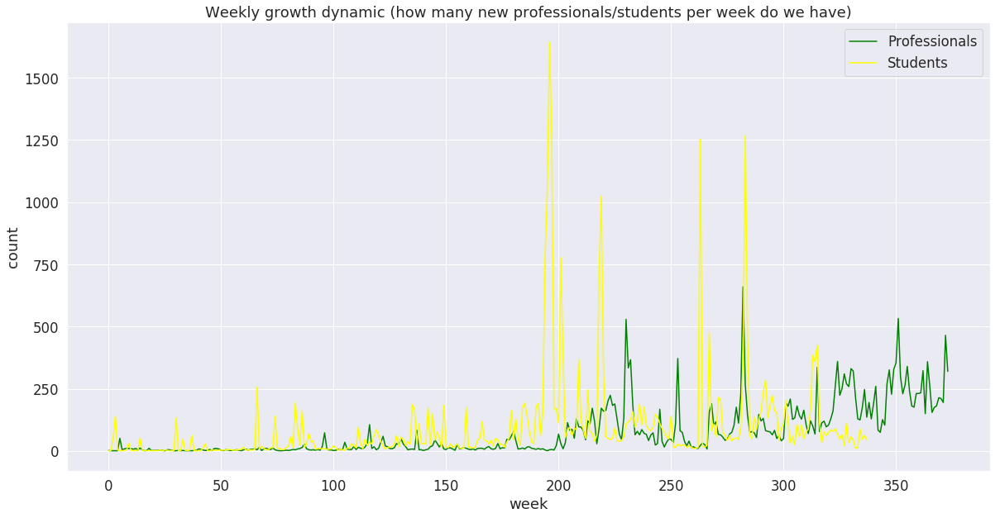

In [375]:
plt.figure(figsize=(20, 10))
plt.plot(professionals_weekly_count.professionals_count, label='Professionals', color='green')
plt.plot(students_weekly_count.students_count, label='Students', color='yellow')
plt.xlabel('week')
plt.ylabel('count')
plt.title('Weekly growth dynamic (how many new professionals/students per week do we have)')
plt.legend()
plt.show()

### <a id='924'>Daily</a>

In [0]:
professionals_daily_count = calculate_daily_count(professionals, 'professionals')
students_daily_count = calculate_daily_count(students, 'students')

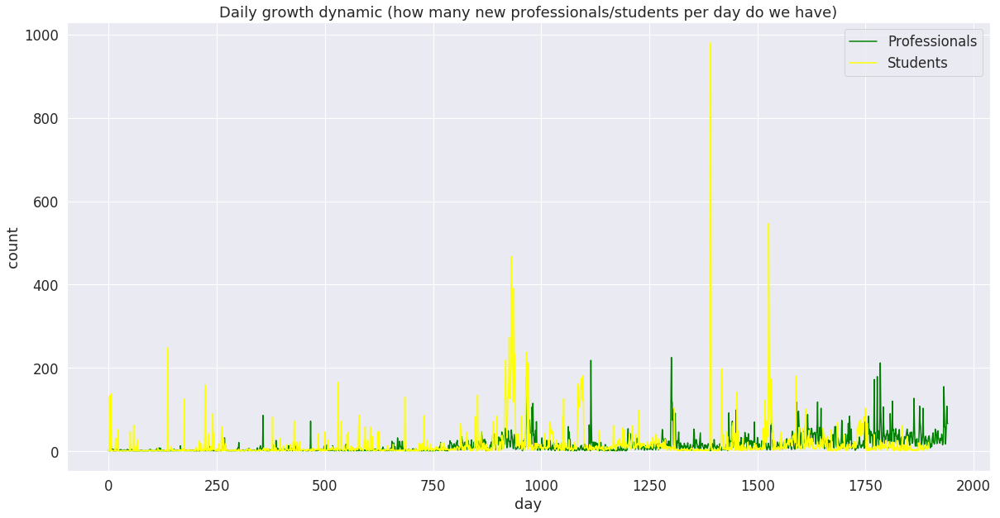

In [377]:
plt.figure(figsize=(20, 10))
plt.plot(professionals_daily_count.professionals_count, label='Professionals', color='green')
plt.plot(students_daily_count.students_count, label='Students', color='yellow')
plt.xlabel('day')
plt.ylabel('count')
plt.title('Daily growth dynamic (how many new professionals/students per day do we have)')
plt.legend()
plt.show()

## <a id='93'>Cumulative questions/answers/comments growth</a>

### <a id='931'>Yearly</a>

In [0]:
questions_yearly_cumcount = calculate_yearly_cumsum(questions, 'questions')
answers_yearly_cumcount = calculate_yearly_cumsum(answers, 'answers')
comments_yearly_cumcount = calculate_yearly_cumsum(comments, 'comments')

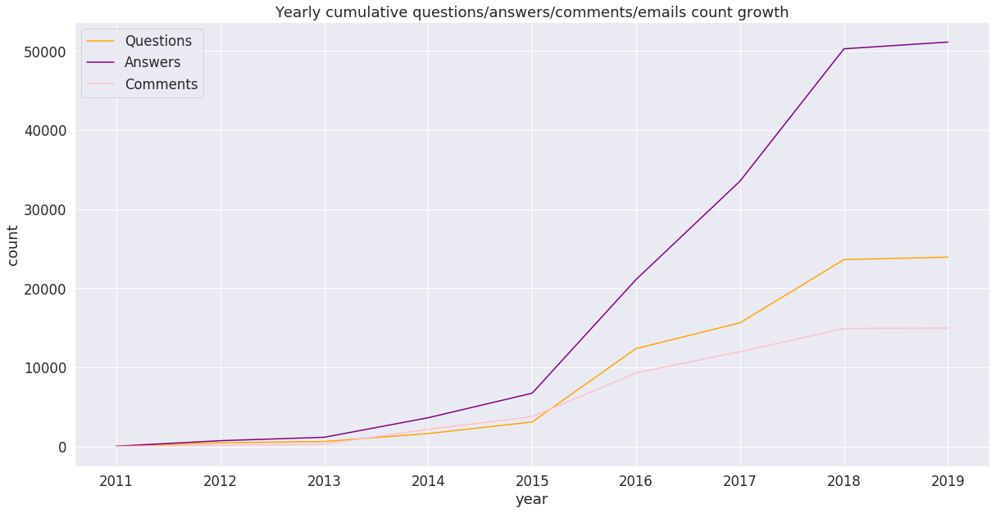

In [379]:
plt.figure(figsize=(20, 10))
plt.plot(questions_yearly_cumcount, label='Questions', color='orange')
plt.plot(answers_yearly_cumcount, label='Answers', color='purple')
plt.plot(comments_yearly_cumcount, label='Comments', color='pink')
plt.xlabel('year')
plt.ylabel('count')
plt.title('Yearly cumulative questions/answers/comments/emails count growth')
plt.legend()
plt.show()

### <a id='932'>Monthly</a>

In [0]:
questions_monthly_cumcount = calculate_monthly_cumsum(questions, 'questions')
answers_monthly_cumcount = calculate_monthly_cumsum(answers, 'answers')
comments_monthly_cumcount = calculate_monthly_cumsum(comments, 'comments')

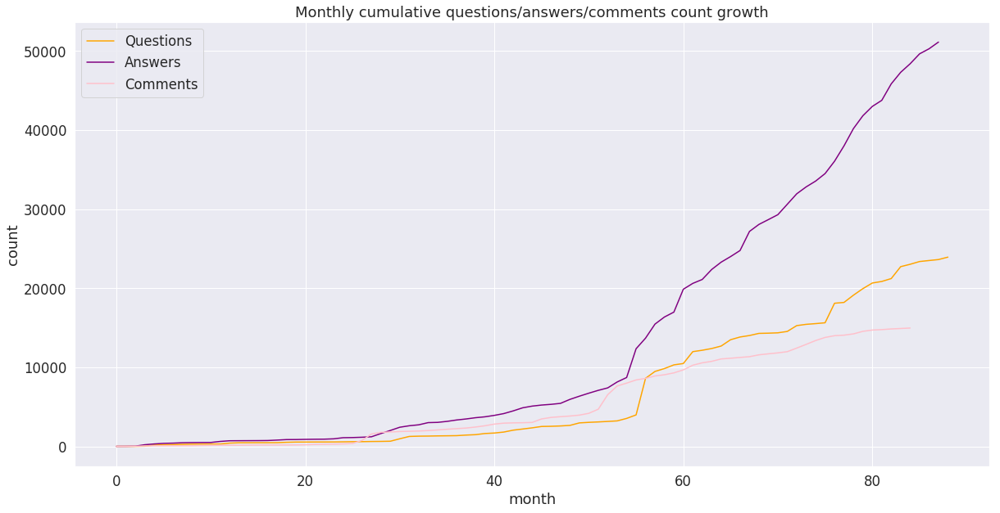

In [381]:
plt.figure(figsize=(20, 10))
plt.plot(questions_monthly_cumcount.questions_count, label='Questions', color='orange')
plt.plot(answers_monthly_cumcount.answers_count, label='Answers', color='purple')
plt.plot(comments_monthly_cumcount.comments_count, label='Comments', color='pink')
plt.xlabel('month')
plt.ylabel('count')
plt.title('Monthly cumulative questions/answers/comments count growth')
plt.legend()
plt.show()

### <a id='933'>Weekly</a>

In [0]:
questions_weekly_cumcount = calculate_weekly_cumsum(questions, 'questions')
answers_weekly_cumcount = calculate_weekly_cumsum(answers, 'answers')
comments_weekly_cumcount = calculate_weekly_cumsum(comments, 'comments')

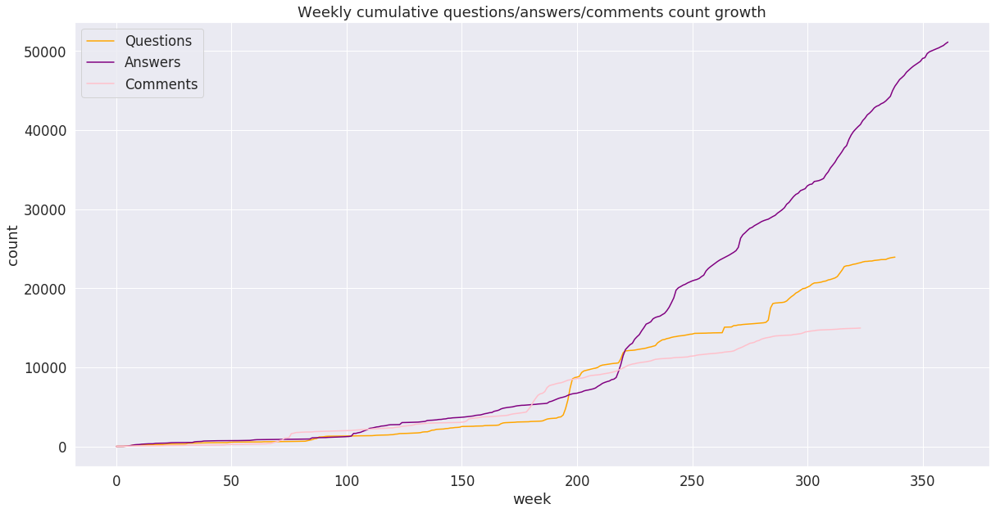

In [383]:
plt.figure(figsize=(20, 10))
plt.plot(questions_weekly_cumcount.questions_count, label='Questions', color='orange')
plt.plot(answers_weekly_cumcount.answers_count, label='Answers', color='purple')
plt.plot(comments_weekly_cumcount.comments_count, label='Comments', color='pink')
plt.xlabel('week')
plt.ylabel('count')
plt.title('Weekly cumulative questions/answers/comments count growth')
plt.legend()
plt.show()

### <a id='934'>Daily</a>

In [0]:
questions_daily_cumcount = calculate_daily_cumsum(questions, 'questions')
answers_daily_cumcount = calculate_daily_cumsum(answers, 'answers')
comments_daily_cumcount = calculate_daily_cumsum(comments, 'comments')

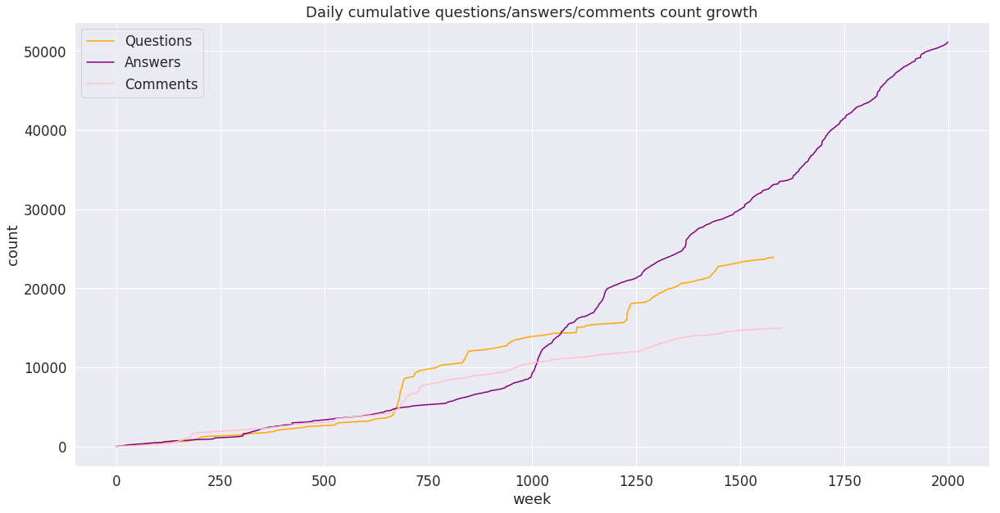

In [385]:
plt.figure(figsize=(20, 10))
plt.plot(questions_daily_cumcount.questions_count, label='Questions', color='orange')
plt.plot(answers_daily_cumcount.answers_count, label='Answers', color='purple')
plt.plot(comments_daily_cumcount.comments_count, label='Comments', color='pink')
plt.xlabel('week')
plt.ylabel('count')
plt.title('Daily cumulative questions/answers/comments count growth')
plt.legend()
plt.show()

## <a id='94'>Questions/answers/comments growth dynamic</a>

### <a id='941'>Yearly</a>

In [0]:
questions_yearly_count = calculate_yearly_count(questions, 'questions')
answers_yearly_count = calculate_yearly_count(answers, 'answers')
comments_yearly_count = calculate_yearly_count(comments, 'comments')

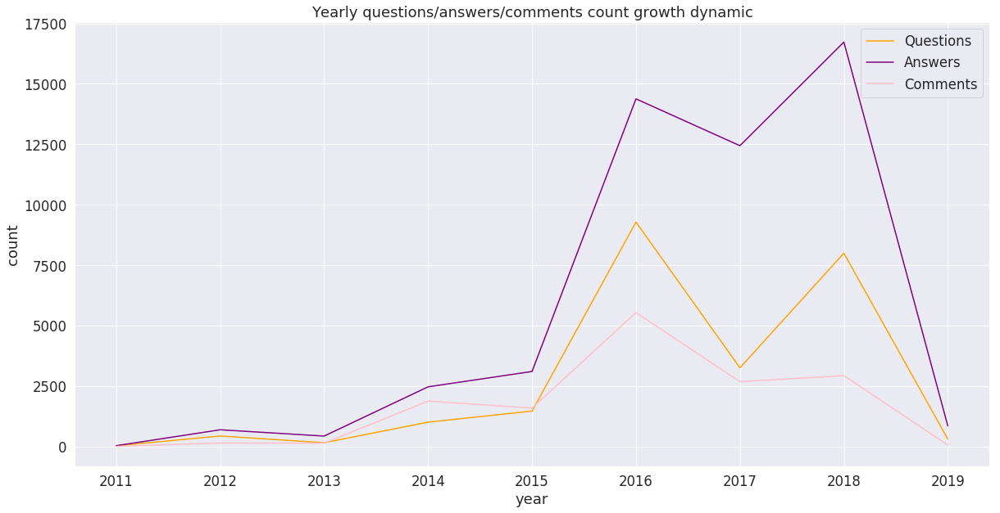

In [387]:
plt.figure(figsize=(20, 10))
plt.plot(questions_yearly_count, label='Questions', color='orange')
plt.plot(answers_yearly_count, label='Answers', color='purple')
plt.plot(comments_yearly_count, label='Comments', color='pink')
plt.xlabel('year')
plt.ylabel('count')
plt.title('Yearly questions/answers/comments count growth dynamic')
plt.legend()
plt.show()

### <a id='942'>Monthly</a>

In [0]:
questions_monthly_count = calculate_monthly_count(questions, 'questions')
answers_monthly_count = calculate_monthly_count(answers, 'answers')
comments_monthly_count = calculate_monthly_count(comments, 'comments')

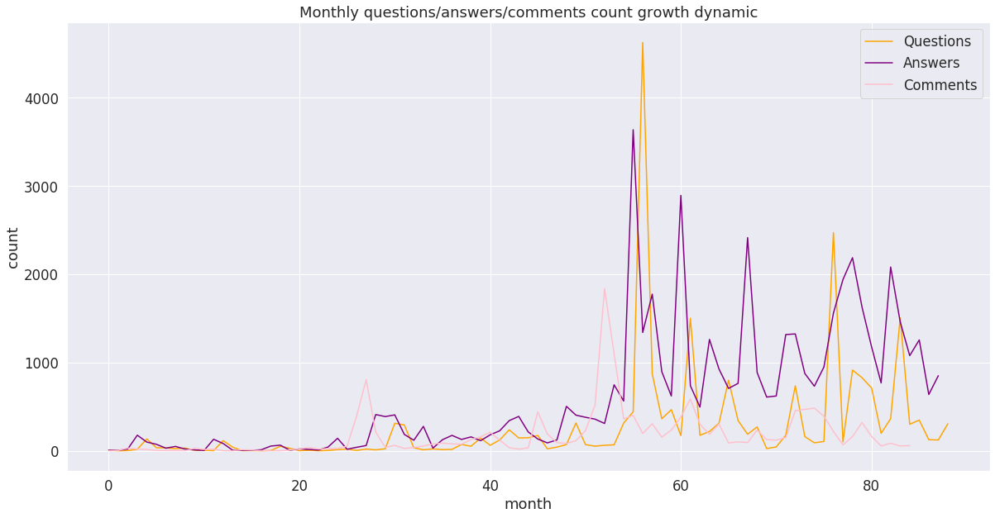

In [389]:
plt.figure(figsize=(20, 10))
plt.plot(questions_monthly_count.questions_count, label='Questions', color='orange')
plt.plot(answers_monthly_count.answers_count, label='Answers', color='purple')
plt.plot(comments_monthly_count.comments_count, label='Comments', color='pink')
plt.xlabel('month')
plt.ylabel('count')
plt.title('Monthly questions/answers/comments count growth dynamic')
plt.legend()
plt.show()

### <a id='943'>Weekly</a>

In [0]:
questions_weekly_count = calculate_weekly_count(questions, 'questions')
answers_weekly_count = calculate_weekly_count(answers, 'answers')
comments_weekly_count = calculate_weekly_count(comments, 'comments')

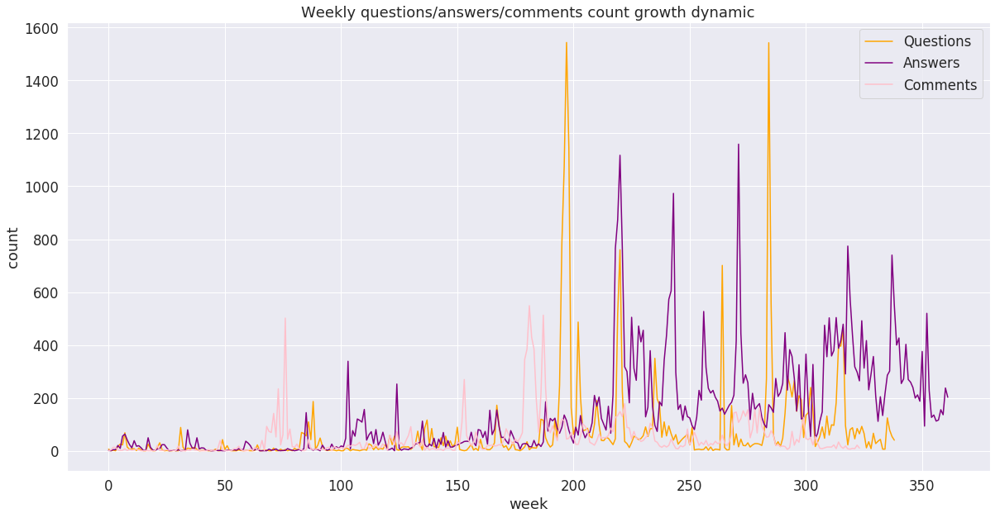

In [390]:
plt.figure(figsize=(20, 10))
plt.plot(questions_weekly_count.questions_count, label='Questions', color='orange')
plt.plot(answers_weekly_count.answers_count, label='Answers', color='purple')
plt.plot(comments_weekly_count.comments_count, label='Comments', color='pink')
plt.xlabel('week')
plt.ylabel('count')
plt.title('Weekly questions/answers/comments count growth dynamic')
plt.legend()
plt.show()

### <a id='944'>Daily</a>

In [0]:
questions_daily_count = calculate_daily_count(questions, 'questions')
answers_daily_count = calculate_daily_count(answers, 'answers')
comments_daily_count = calculate_daily_count(comments, 'comments')

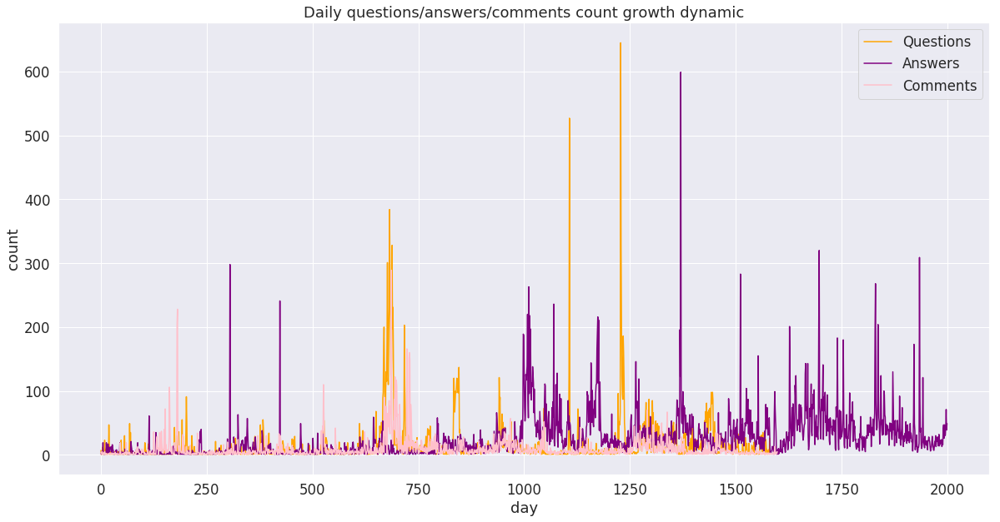

In [392]:
plt.figure(figsize=(20, 10))
plt.plot(questions_daily_count.questions_count, label='Questions', color='orange')
plt.plot(answers_daily_count.answers_count, label='Answers', color='purple')
plt.plot(comments_daily_count.comments_count, label='Comments', color='pink')
plt.xlabel('day')
plt.ylabel('count')
plt.title('Daily questions/answers/comments count growth dynamic')
plt.legend()
plt.show()

## <a id='95'>Professionals</a>

Okay, we've got some understanding of community growth.

But now let's try to see what types of members do we have.

For example:
- how many professionals ask but not answer questions;
- how many of them also comment questions/answers;
- etc.

### <a id='951'>Professionals by answered_questions/asked_questions/wrote_comments flags</a>

In [0]:
professionals['answered_questions'] = professionals.id.isin(answers.author_id)
professionals['asked_questions'] = professionals.id.isin(questions.author_id)
professionals['wrote_comments'] = professionals.id.isin(answers.author_id)

In [0]:
professionals_crosstab_stats = pd.crosstab(
    professionals.year,
    [
        professionals.answered_questions,
        professionals.asked_questions,
        professionals.wrote_comments
    ],
    rownames=[
        'year'
    ],
    colnames=[
        'answered questions',
        'asked questions',
        'wrote comments'
    ]
).cumsum().apply(lambda row: 100 * row / sum(row), axis=1)

In [395]:
professionals_crosstab_stats

answered questions      False                True           
asked questions         False     True       False     True 
wrote comments          False     False      True      True 
year                                                        
2011                36.842105  0.000000  59.649123  3.508772
2012                46.953405  0.358423  50.537634  2.150538
2013                51.129944  0.141243  47.598870  1.129944
2014                47.728614  0.058997  51.740413  0.471976
2015                49.829985  0.061824  49.799073  0.309119
2016                54.049475  0.033887  45.769796  0.146843
2017                56.975288  0.032949  42.899506  0.092257
2018                63.285602  0.022432  36.639623  0.052342
2019                64.219238  0.021313  35.709719  0.049730

So each year there is a big part of professionals community which does not ask questions, does not answer questions and does not write comments (from ~36.84% in 2011th to ~64.22% in 2019th).

Also there is another big part of professionals community which answer questions and writes comments (from ~35.71% in 2019th to ~59.65% in 2011th).

### <a id='952'>Distribution of professionals by questions/answers/comments count</a>

Okay, now we need to gather some information about professionals activity (how many questions/answers/comments they have).

To do it we create a separate table with question/answer/comment IDs to calculate counts of questions/answers/comments for each professional:

In [0]:
professionals_questions_answers_comments = pd.merge(
    professionals[['id', 'date_joined']],
    questions[['author_id', 'date_added']],
    left_on='id',
    right_on='author_id',
    how='left'
)
professionals_questions_answers_comments.rename({
    'author_id': 'question_author_id',
    'date_added': 'question_date_added'
}, axis=1, inplace=True)
professionals_questions_answers_comments = pd.merge(
    professionals_questions_answers_comments,
    answers[['author_id', 'date_added']],
    left_on='id',
    right_on='author_id',
    how='left'
)
professionals_questions_answers_comments.rename({
    'author_id': 'answer_author_id',
    'date_added': 'answer_date_added'
}, axis=1, inplace=True)
professionals_questions_answers_comments = pd.merge(
    professionals_questions_answers_comments,
    comments[['author_id', 'date_added']],
    left_on='id',
    right_on='author_id',
    how='left'
)
professionals_questions_answers_comments.rename({
    'author_id': 'comment_author_id',
    'date_added': 'comment_date_added'
}, axis=1, inplace=True)

In [401]:
professionals_questions_answers_comments.head()

,id,date_joined,question_author_id,question_date_added,answer_author_id,answer_date_added,comment_author_id,comment_date_added
0,9ced4ce7519049c0944147afb75a8ce3,2011-10-05 20:35:19,NaN,NaT,9ced4ce7519049c0944147afb75a8ce3,2011-10-05 20:42:09,NaN,NaT
1,f718dcf6d2ec4cb0a52a9db59d7f9e67,2011-10-05 20:49:21,NaN,NaT,NaN,NaT,NaN,NaT
2,0c673e046d824ec0ad0ebe012a0673e4,2011-10-18 17:31:26,0c673e046d824ec0ad0ebe012a0673e4,2011-12-29 05:26:28,0c673e046d824ec0ad0ebe012a0673e4,2012-10-01 04:35:42,0c673e046d824ec0ad0ebe012a0673e4,2013-06-07 12:48:14
3,0c673e046d824ec0ad0ebe012a0673e4,2011-10-18 17:31:26,0c673e046d824ec0ad0ebe012a0673e4,2011-12-29 05:26:28,0c673e046d824ec0ad0ebe012a0673e4,2012-10-01 04:35:42,0c673e046d824ec0ad0ebe012a0673e4,2013-03-04 04:28:36
4,0c673e046d824ec0ad0ebe012a0673e4,2011-10-18 17:31:26,0c673e046d824ec0ad0ebe012a0673e4,2011-12-29 05:26:28,0c673e046d824ec0ad0ebe012a0673e4,2012-10-01 04:35:42,0c673e046d824ec0ad0ebe012a0673e4,2012-10-08 12:13:28


In [0]:
professionals_questions_answers_comments_grouped = professionals_questions_answers_comments.groupby('id')[
    ['question_author_id', 'answer_author_id', 'comment_author_id']
].count().reset_index().rename({
    'question_author_id': 'questions_count',
    'answer_author_id': 'answers_count',
    'comment_author_id': 'comments_count'
}, axis=1)

In [398]:
professionals_questions_answers_comments_grouped.questions_count.nunique()

12

In [406]:
professionals_questions_answers_comments_grouped.questions_count.unique()

array([     0,      6,   8970,     13,      3,      1,   3696,      7,
          207, 164424,   2860,      4])

In [399]:
professionals_questions_answers_comments_grouped.answers_count.nunique()

171

In [408]:
professionals_questions_answers_comments_grouped.answers_count.unique()

array([     3,      0,     24,      4,      5,      2,      1,     13,
            8,      6,     21,     12,     42,      7,      9,     11,
           15,     18,     69,     93,    134,     38,     16,     23,
           30,     40,    616,    108,     14,     10,     29,     34,
           36,     19,    762,     20,     33,   8970,     46,    222,
          396,     85,    291,     22,     73,     56,     17,    123,
           25,    195,    120,     52,     48,     72,     63,     96,
           47,    172,    132,     65,     87,     44,    124,     60,
           50,     95,    342,     61,     64,   4872,     70,     54,
       542070,     49,    520,     31,    225,     27,    330,     28,
          144,     32,     62,    868,    430,    105,     45,     58,
           26,    390,   1782, 177920,    178,     88,    190,     66,
           78,     68,     75,    510,    100,     94,    165,   3696,
           51,     71,    364,    360,     84,    671,     43,    270,
      

In [400]:
professionals_questions_answers_comments_grouped.comments_count.nunique()

161

In [409]:
professionals_questions_answers_comments_grouped.comments_count.unique()

array([     0,      1,      3,      4,     21,      6,     42,     69,
           93,    134,     16,      7,     30,     40,    108,     12,
           34,     14,      2,    762,     33,     20,   8970,     46,
           23,    222,    396,     85,     36,      8,      9,    291,
           11,     22,     13,     56,    123,      5,    195,     38,
           18,    120,     52,     48,     72,     63,     96,     10,
           24,    172,    132,     65,     87,     15,     44,    124,
           60,     50,     95,    342,     64,   4872,     70,     54,
       542070,     49,    520,     31,    225,     27,    330,     29,
          144,     32,    868,    430,    105,     28,     26,    390,
         1782,     45, 177920,     19,    178,     62,     88,    190,
           66,     68,     75,    510,    100,     94,     25,     17,
          165,   3696,    364,    360,     84,    671,     43,    270,
           90,   1071,    378,    235,     74,     86,    106,    540,
      

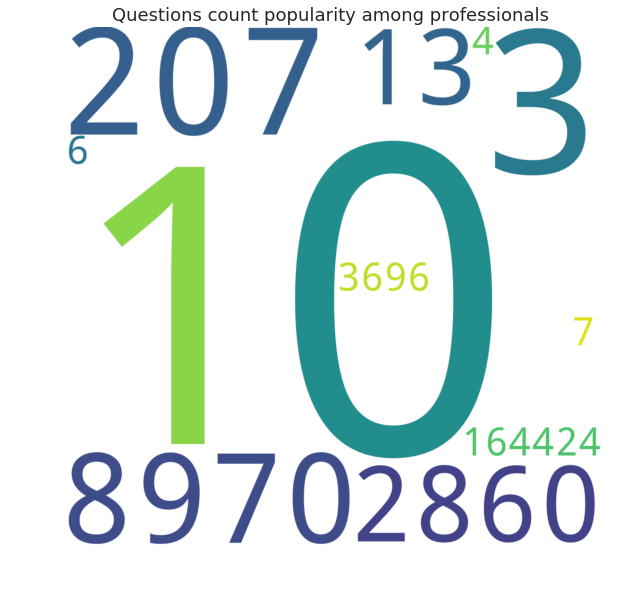

In [411]:
plt.figure(figsize=(20, 10))
plt.imshow(
    wordcloud.WordCloud(
        min_font_size=8,
        relative_scaling=0.1,
        background_color='white',
        width=2000,
        height=2000
    ).generate_from_frequencies(
        dict(
            zip(
                list(map(str, professionals_questions_answers_comments_grouped.questions_count.value_counts().index)),
                professionals_questions_answers_comments_grouped.questions_count.value_counts().values
            )
        )
    ),
    interpolation='bilinear'
)
plt.title("Questions count popularity among professionals")
plt.axis("off")
plt.show()

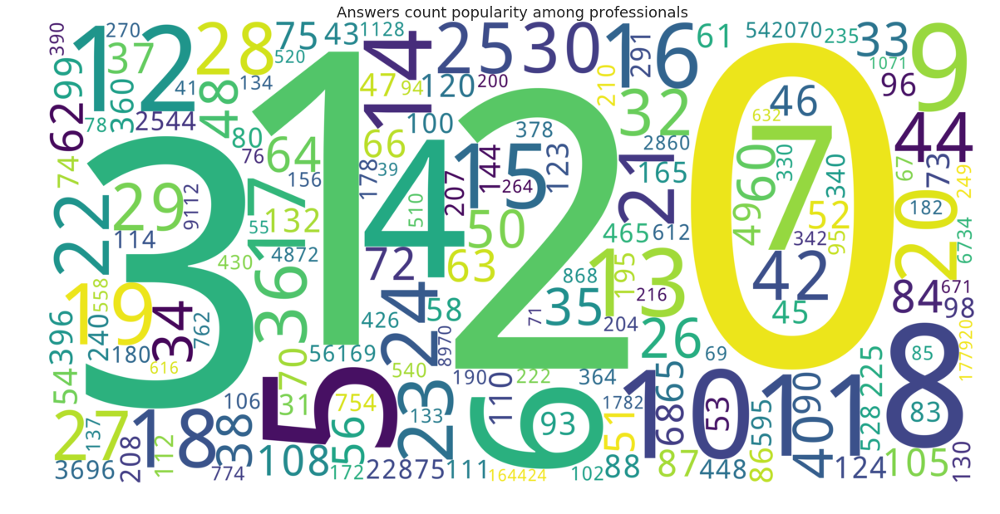

In [412]:
plt.figure(figsize=(20, 20))
plt.imshow(
    wordcloud.WordCloud(
        min_font_size=8,
        relative_scaling=0.1,
        background_color='white',
        width=4000,
        height=2000
    ).generate_from_frequencies(
        dict(
            zip(
                list(map(str, professionals_questions_answers_comments_grouped.answers_count.value_counts().index)),
                professionals_questions_answers_comments_grouped.answers_count.value_counts().values
            )
        )
    ),
    interpolation="bilinear"
)
plt.title("Answers count popularity among professionals")
plt.axis("off")
plt.show()

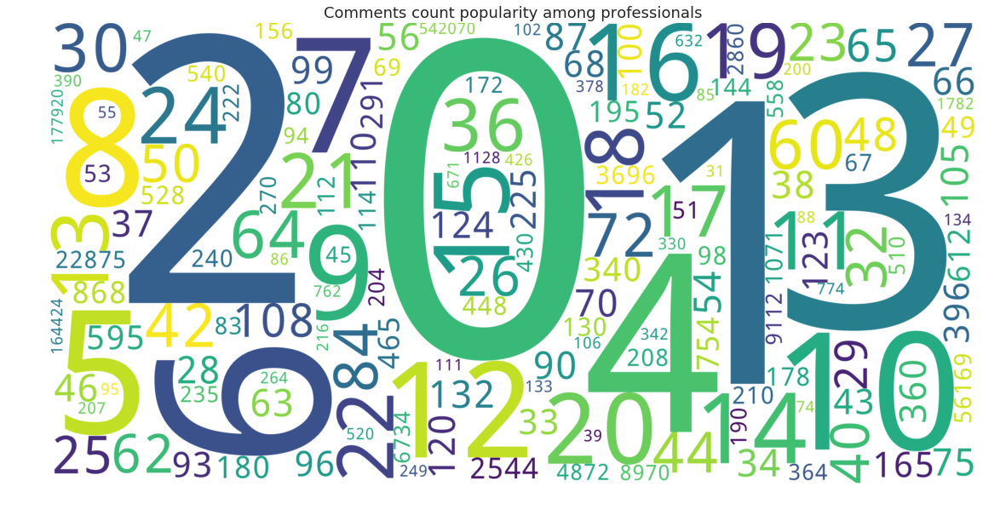

In [413]:
plt.figure(figsize=(20, 10))
plt.imshow(
    wordcloud.WordCloud(
        min_font_size=8,
        relative_scaling=0.1,
        background_color='white',
        width=4000,
        height=2000
    ).generate_from_frequencies(
        dict(
            zip(
                list(map(str, professionals_questions_answers_comments_grouped.comments_count.value_counts().index)),
                professionals_questions_answers_comments_grouped.comments_count.value_counts().values
            )
        )
    ),
    interpolation='bilinear'
)
plt.title("Comments count popularity among professionals")
plt.axis("off")
plt.show()

### <a id='953'>Professionals locations, industries, headlines</a>

Okay, enough of questions and answers))

Not that I would stop asking questions and searching for answers but, hey, you know what I mean))

Let's now concentrate more on three other columns namely:
- location;
- industry;
- headline.

In [414]:
print('Unique locations number: ', professionals.location.nunique())
print('Unique industries number: ', professionals.industry.nunique())
print('Unique headlines number: ', professionals.headline.nunique())

Unique locations number:  2582
Unique industries number:  2470
Unique headlines number:  22272


To much of unique values so it will be inconvenient to use TOP-something or countplot, or pieplot.

But probably something like wordcloud would help.

Let's try:

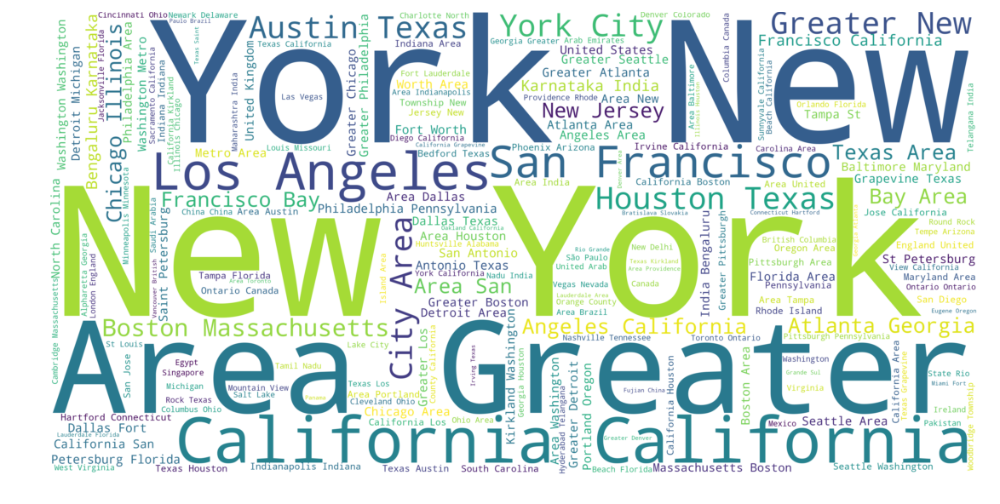

In [415]:
plt.figure(figsize=(20, 10))
plt.imshow(
    wordcloud.WordCloud(
        min_font_size=8,
        relative_scaling=0.1,
        background_color='white',
        width=4000,
        height=2000
    ).generate(' '.join(professionals.location.dropna().values)),
    interpolation='bilinear'
)
plt.axis("off")
plt.show()

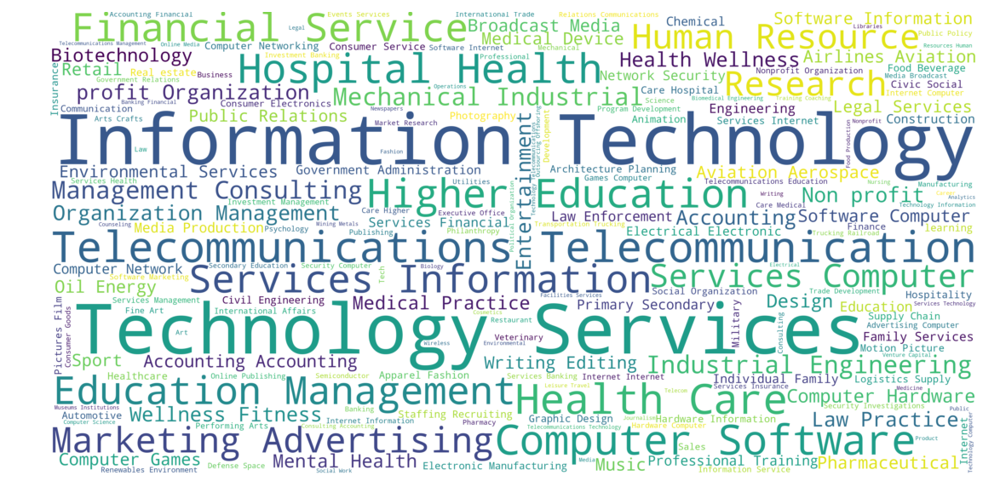

In [416]:
plt.figure(figsize=(20, 10))
plt.imshow(
    wordcloud.WordCloud(
        min_font_size=8,
        relative_scaling=0.1,
        background_color='white',
        width=4000,
        height=2000
    ).generate(' '.join(professionals.industry.dropna().values)),
    interpolation='bilinear'
)
plt.axis("off")
plt.show()

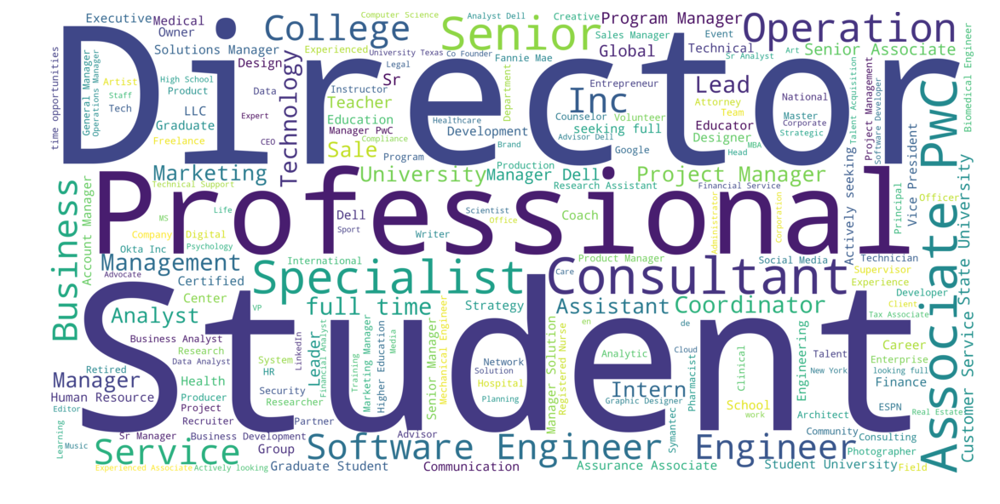

In [417]:
plt.figure(figsize=(20, 10))
plt.imshow(
    wordcloud.WordCloud(
        min_font_size=8,
        relative_scaling=0.1,
        background_color='white',
        width=4000,
        height=2000
    ).generate(' '.join(professionals.headline.dropna().values)),
    interpolation='bilinear'
)
plt.axis("off")
plt.show()

## <a id='96'>Students</a>

### <a id='961'>Students by answered_questions/asked_questions/wrote_comments flags</a>

In [0]:
students['answered_questions'] = students.id.isin(answers.author_id)
students['asked_questions'] = students.id.isin(questions.author_id)
students['wrote_comments'] = students.id.isin(answers.author_id)

In [0]:
students_crosstab_stats = pd.crosstab(
    students.year,
    [
        students.answered_questions,
        students.asked_questions,
        students.wrote_comments
    ],
    rownames=[
        'year'
    ],
    colnames=[
        'answered questions',
        'asked questions',
        'wrote comments'
    ]
).cumsum().apply(lambda row: 100 * row / sum(row), axis=1)

In [420]:
students_crosstab_stats

answered questions      False                True           
asked questions         False      True      False     True 
wrote comments          False      False     True      True 
year                                                        
2011                50.000000  50.000000  0.000000  0.000000
2012                56.043956  41.318681  0.659341  1.978022
2013                69.268293  29.463415  0.390244  0.878049
2014                69.093557  30.396797  0.182017  0.327630
2015                67.950404  31.730227  0.131505  0.187864
2016                62.922380  36.974356  0.040158  0.063106
2017                64.739180  35.160672  0.043543  0.056605
2018                60.376376  39.532461  0.039070  0.052094
2019                60.233767  39.675826  0.038746  0.051661

Here we also see that at least half of students does not ask questions, does not answer questions and does not write comments.

But still there are students (and not that few) who ask questions.

### <a id='962'>Students locations</a>

In [421]:
print('Unique locations number: ', students.location.nunique())

Unique locations number:  5480


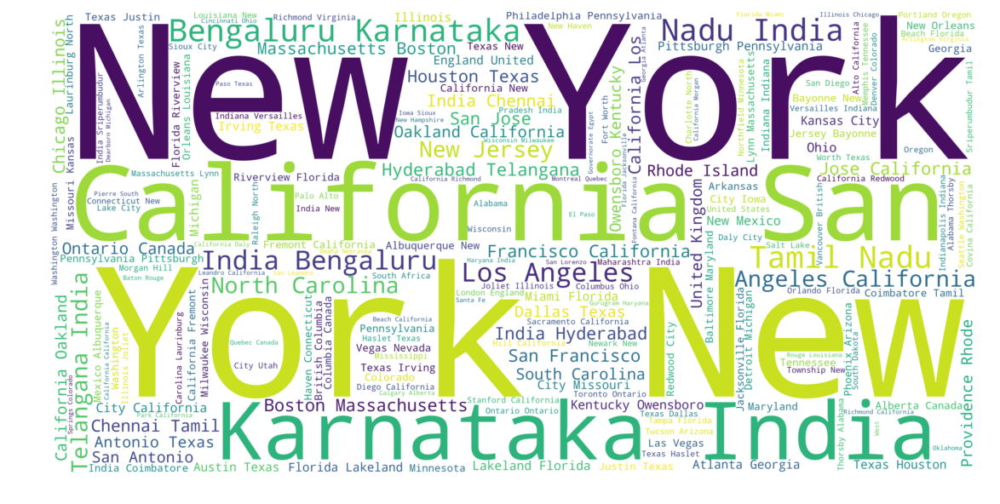

In [422]:
plt.figure(figsize=(20, 10))
plt.imshow(
    wordcloud.WordCloud(
        min_font_size=8,
        relative_scaling=0.1,
        background_color='white',
        width=4000,
        height=2000
    ).generate(' '.join(students.location.dropna().values)),
    interpolation='bilinear'
)
plt.axis("off")
plt.show()

### <a id='97'>Tags</a>

In [0]:
tag_users_with_names = pd.merge(tag_users, tags, how='inner', on='tag_id')

In [0]:
professional_tags = tag_users_with_names[tag_users_with_names.user_id.isin(professionals.id)]

In [0]:
student_tags = tag_users_with_names[tag_users_with_names.user_id.isin(students.id)]

In [430]:
professional_tags.tag_name.nunique()

10520

In [431]:
student_tags.tag_name.nunique()

4110

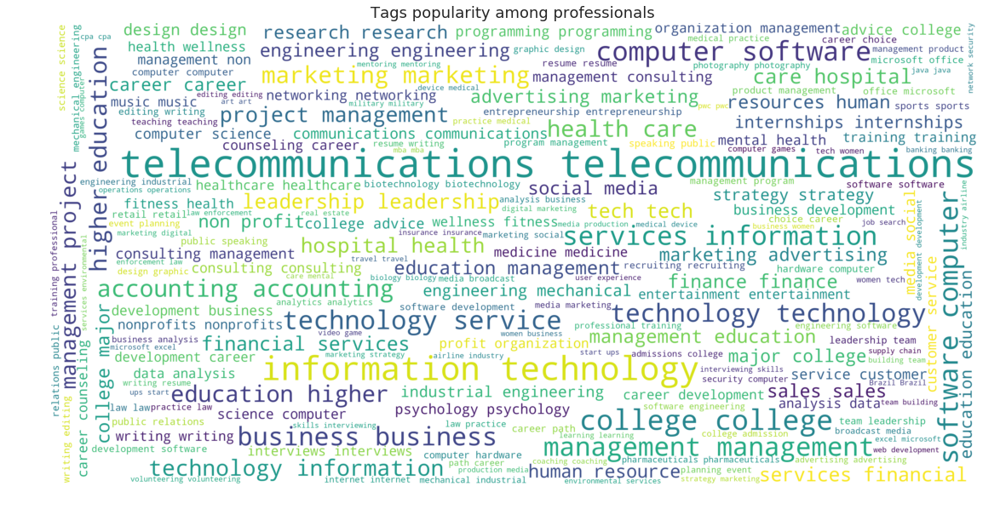

In [427]:
plt.figure(figsize=(20, 10))
plt.imshow(
    wordcloud.WordCloud(
        min_font_size=8,
        background_color='white',
        width=4000,
        height=2000
    ).generate(' '.join(professional_tags.tag_name.values)),
    interpolation='bilinear'
)
plt.title("Tags popularity among professionals")
plt.axis("off")
plt.show()

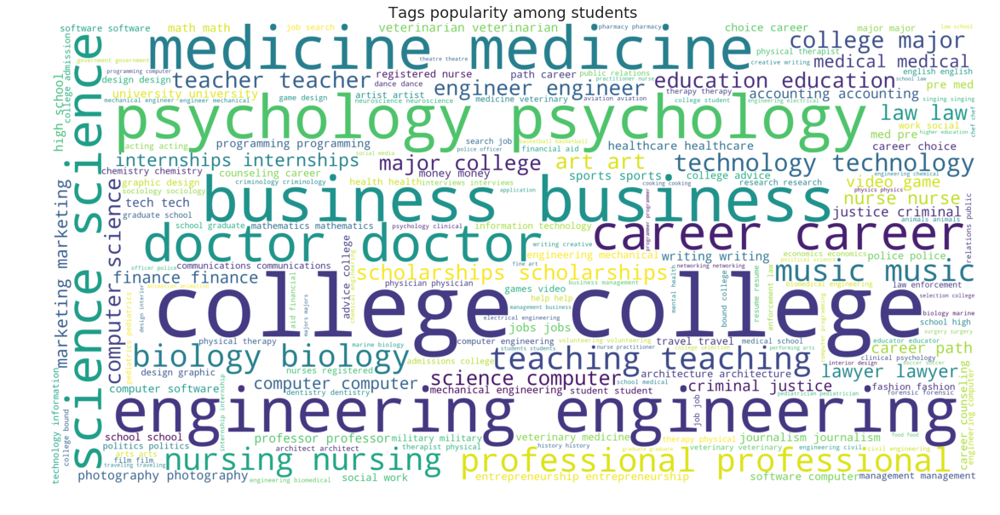

In [428]:
plt.figure(figsize=(20, 10))
plt.imshow(
    wordcloud.WordCloud(
        min_font_size=8,
        background_color='white',
        width=4000,
        height=2000
    ).generate(' '.join(student_tags.tag_name.values)),
    interpolation='bilinear'
)
plt.title("Tags popularity among students")
plt.axis("off")
plt.show()

### <a id='98'>Emails</a>

In [432]:
emails.head()

,id,recipient_id,date_sent,frequency_level,year,month,week,day,hour
0,2337714,0c673e046d824ec0ad0ebe012a0673e4,2018-12-07 01:05:40,email_notification_daily,2018,12,49,7,1
1,2336077,0c673e046d824ec0ad0ebe012a0673e4,2018-12-06 01:14:15,email_notification_daily,2018,12,49,6,1
2,2314660,0c673e046d824ec0ad0ebe012a0673e4,2018-11-17 00:38:27,email_notification_daily,2018,11,46,17,0
3,2312639,0c673e046d824ec0ad0ebe012a0673e4,2018-11-16 00:32:19,email_notification_daily,2018,11,46,16,0
4,2299700,0c673e046d824ec0ad0ebe012a0673e4,2018-11-08 00:16:40,email_notification_daily,2018,11,45,8,0


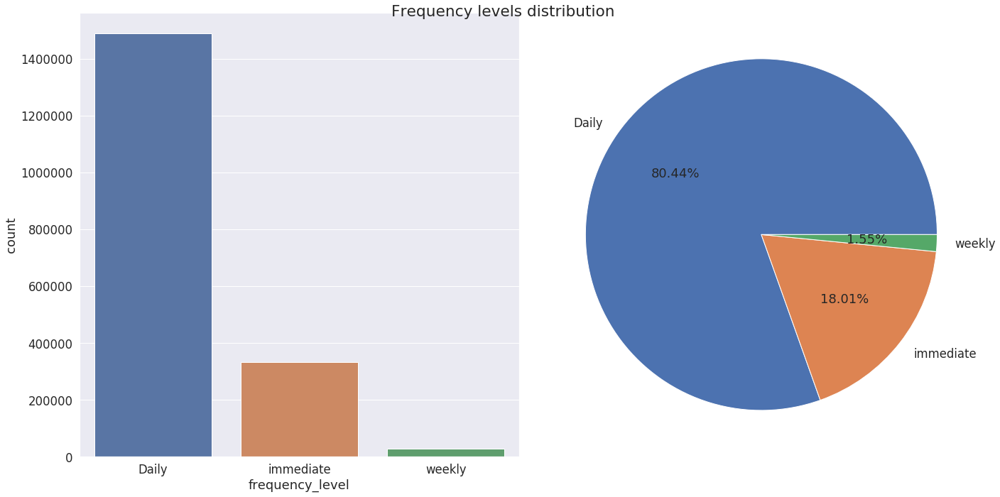

In [437]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
sns.countplot(x=emails.frequency_level, ax=ax1)
ax1.set_xticklabels(['Daily', 'immediate', 'weekly'])
ax2.pie(
    x=emails.frequency_level.value_counts().values,
    labels=['Daily', 'immediate', 'weekly'],
    autopct='%1.2f%%'
)
plt.suptitle('Frequency levels distribution')
plt.tight_layout()
plt.show()

### <a id='99'>Matches</a>

In [438]:
matches.head()

,email_id,question_id
0,1721939,332a511f1569444485cf7a7a556a5e54
1,1665388,332a511f1569444485cf7a7a556a5e54
2,1636634,332a511f1569444485cf7a7a556a5e54
3,1635498,332a511f1569444485cf7a7a556a5e54
4,1620298,332a511f1569444485cf7a7a556a5e54


Here we've got a table that contains the information about what email matches what question.

But what does it mean?

Can we interpret it as a positive examples?

Are these questions somehow different from the questions that are not in in this "matches" table?

Let's try to fing out!

In [0]:
questions['with_matches'] = questions.id.isin(matches.question_id)
questions['with_answers'] = questions.id.isin(answers.question_id)
questions['with_comments'] = questions.id.isin(comments.parent_content_id)

In [440]:
pd.crosstab(
    questions.with_matches,
    [
        questions.with_answers,
        questions.with_comments
    ],
    rownames=[
        'with matches'
    ],
    colnames=[
        'with answers',
        'with comments'
    ],
    normalize=True
) * 100

with answers      False                True           
with comments     False     True       False     True 
with matches                                          
False          0.380260  0.271614   7.078685  0.781413
True           2.553174  0.225649  82.152856  6.556350

In [441]:
pd.crosstab(
    questions[questions.with_matches].with_matches,
    [
        questions[questions.with_matches].with_answers,
        questions[questions.with_matches].with_comments
    ],
    rownames=[
        'with matches'
    ],
    colnames=[
        'with answers',
        'with comments'
    ],
    normalize=True
) * 100

with answers      False                True           
with comments     False     True       False     True 
with matches                                          
True           2.790719  0.246643  89.796291  7.166347

In [442]:
pd.crosstab(
    questions[~questions.with_matches].with_matches,
    [
        questions[~questions.with_matches].with_answers,
        questions[~questions.with_matches].with_comments
    ],
    rownames=[
        'with matches'
    ],
    colnames=[
        'with answers',
        'with comments'
    ],
    normalize=True
) * 100

with answers      False                True           
with comments     False     True       False     True 
with matches                                          
False          4.467354  3.190967  83.161512  9.180167

Well, as we can see from this crosstab:
- ~82.15% of questions are with matches and they have answers;
- ~6.56%  of questions are with matches and they have not only answers but also comments;
- ~2.55% of questions are with matches AND YET THEY DO NOT HAVE ANSWERS;
- ~7.08% of questions are without matches AND YET THEY HAVE ANSWERS;
- ~83.16% of questions without matches DO HAVE ANSWERS and ~9.18% of questions without matches HAVE NOT ONLY ANSWERS BUT ALSO COMMENTS.


It looks that the simple boolean flag of answer presence cannot separate questions with matches from questions without matches.

But what about the time difference between question and answer?

In [443]:
questions.head()

,id,author_id,date_added,title,body,year,month,week,day,hour,with_matches,with_answers,with_comments
0,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26,Teacher career question,What is a maths teacher? what is a ma...,2016,4,17,26,11,True,True,False
1,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...,2016,5,20,20,16,True,True,False
2,4ec31632938a40b98909416bdd0decff,f2c179a563024ccc927399ce529094b5,2017-02-08 19:13:38,Will going abroad for your first job increase ...,I'm planning on going abroad for my first job....,2017,2,6,8,19,True,True,False
3,2f6a9a99d9b24e5baa50d40d0ba50a75,2c30ffba444e40eabb4583b55233a5a4,2017-09-01 14:05:32,To become a specialist in business management...,i hear business management is a hard way to ge...,2017,9,35,1,14,True,True,False
4,5af8880460c141dbb02971a1a8369529,aa9eb1a2ab184ebbb00dc01ab663428a,2017-09-01 02:36:54,Are there any scholarships out there for stude...,I'm trying to find scholarships for first year...,2017,9,35,1,2,True,True,False


In [444]:
answers.head()

,id,author_id,question_id,date_added,body,year,month,week,day,hour
0,4e5f01128cae4f6d8fd697cec5dca60c,36ff3b3666df400f956f8335cf53e09e,332a511f1569444485cf7a7a556a5e54,2016-04-29 19:40:14,<p>Hi!</p>\n<p>You are asking a very interesti...,2016,4,17,29,19
1,ada720538c014e9b8a6dceed09385ee3,2aa47af241bf42a4b874c453f0381bd4,eb80205482e4424cad8f16bc25aa2d9c,2018-05-01 14:19:08,<p>Hi. I joined the Army after I attended coll...,2018,5,18,1,14
2,eaa66ef919bc408ab5296237440e323f,cbd8f30613a849bf918aed5c010340be,eb80205482e4424cad8f16bc25aa2d9c,2018-05-02 02:41:02,"<p>Dear Priyanka,</p><p>Greetings! I have answ...",2018,5,18,2,2
3,1a6b3749d391486c9e371fbd1e605014,7e72a630c303442ba92ff00e8ea451df,4ec31632938a40b98909416bdd0decff,2017-05-10 19:00:47,<p>I work for a global company who values high...,2017,5,19,10,19
4,5229c514000446d582050f89ebd4e184,17802d94699140b0a0d2995f30c034c6,2f6a9a99d9b24e5baa50d40d0ba50a75,2017-10-13 22:07:33,I agree with Denise. Every single job I've had...,2017,10,41,13,22


In [0]:
q_and_a = pd.merge(questions, answers, left_on='id', right_on='question_id', how='left', suffixes=('_q', '_a'))

In [0]:
q_and_a.sort_values(by=['date_added_q', 'date_added_a'], inplace=True)

In [447]:
q_and_a.head().T

,14066,14068,14067,14069,16498
id_q,38436aadef3d4b608ad089cf53ab0fe7,38436aadef3d4b608ad089cf53ab0fe7,38436aadef3d4b608ad089cf53ab0fe7,38436aadef3d4b608ad089cf53ab0fe7,edb8c179c5d64c9cb812a59a32045f55
author_id_q,05444a2f42454327b2ac4b463c0adbe0,05444a2f42454327b2ac4b463c0adbe0,05444a2f42454327b2ac4b463c0adbe0,05444a2f42454327b2ac4b463c0adbe0,05444a2f42454327b2ac4b463c0adbe0
date_added_q,2011-09-27 15:23:17,2011-09-27 15:23:17,2011-09-27 15:23:17,2011-09-27 15:23:17,2011-09-27 15:23:54
title,What should I major in if I want to become an ...,What should I major in if I want to become an ...,What should I major in if I want to become an ...,What should I major in if I want to become an ...,What is the typical compensation range for a f...
body_q,<p>Many students want to become investment ban...,<p>Many students want to become investment ban...,<p>Many students want to become investment ban...,<p>Many students want to become investment ban...,Please tell us what the common compensation ra...
year_q,2011,2011,2011,2011,2011
month_q,9,9,9,9,9
week_q,39,39,39,39,39
day_q,27,27,27,27,27
hour_q,15,15,15,15,15


In [0]:
q_and_a['q_and_a_time_diff'] = q_and_a.date_added_a - q_and_a.date_added_q

In [449]:
q_and_a.head().T

,14066,14068,14067,14069,16498
id_q,38436aadef3d4b608ad089cf53ab0fe7,38436aadef3d4b608ad089cf53ab0fe7,38436aadef3d4b608ad089cf53ab0fe7,38436aadef3d4b608ad089cf53ab0fe7,edb8c179c5d64c9cb812a59a32045f55
author_id_q,05444a2f42454327b2ac4b463c0adbe0,05444a2f42454327b2ac4b463c0adbe0,05444a2f42454327b2ac4b463c0adbe0,05444a2f42454327b2ac4b463c0adbe0,05444a2f42454327b2ac4b463c0adbe0
date_added_q,2011-09-27 15:23:17,2011-09-27 15:23:17,2011-09-27 15:23:17,2011-09-27 15:23:17,2011-09-27 15:23:54
title,What should I major in if I want to become an ...,What should I major in if I want to become an ...,What should I major in if I want to become an ...,What should I major in if I want to become an ...,What is the typical compensation range for a f...
body_q,<p>Many students want to become investment ban...,<p>Many students want to become investment ban...,<p>Many students want to become investment ban...,<p>Many students want to become investment ban...,Please tell us what the common compensation ra...
year_q,2011,2011,2011,2011,2011
month_q,9,9,9,9,9
week_q,39,39,39,39,39
day_q,27,27,27,27,27
hour_q,15,15,15,15,15


In [450]:
q_and_a.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51944 entries, 14066 to 20648
Data columns (total 24 columns):
id_q                 51944 non-null object
author_id_q          51944 non-null object
date_added_q         51944 non-null datetime64[ns]
title                51944 non-null object
body_q               51944 non-null object
year_q               51944 non-null int64
month_q              51944 non-null int64
week_q               51944 non-null int64
day_q                51944 non-null int64
hour_q               51944 non-null int64
with_matches         51944 non-null bool
with_answers         51944 non-null bool
with_comments        51944 non-null bool
id_a                 51123 non-null object
author_id_a          51123 non-null object
question_id          51123 non-null object
date_added_a         51123 non-null datetime64[ns]
body_a               51122 non-null object
year_a               51123 non-null float64
month_a              51123 non-null float64
week_a              

In [451]:
q_and_a[q_and_a.id_q.isin(matches.question_id)].q_and_a_time_diff.describe()

count                       46868
mean     129 days 16:29:15.838866
std      206 days 11:48:48.942713
min             -1 days +23:50:01
25%        1 days 01:58:12.250000
50%       21 days 15:05:17.500000
75%      165 days 21:54:41.500000
max            1797 days 23:20:25
Name: q_and_a_time_diff, dtype: object

Hmmm...

There are some really strange q&a pairs where the answer was written EARLIER THAT the question!!!

I do not really understand how is it possible, probably there were some issues in the system.

But, anyway, let's look at them:

In [452]:
q_and_a[
    (q_and_a.id_q.isin(matches.question_id)) &
    (q_and_a.q_and_a_time_diff < pd.Timedelta(0, unit='d'))
].head().T

,50580,25607,3650,8126,47827
id_q,3ee75aafc31747b98f7f2fcce59400f5,19297aca19764e948ba8561ccc5a5a37,f39c4631c3714cf4b39ac4ba470e7c4d,648d575dfcd742d58d8c665dcd4466b9,ec085020316645a5a01a08b5bcddc0c0
author_id_q,d01266e4005849d5905ad05376779c44,2532e4ff2ca6459e95f87edf8c1ee6d9,6ca60cb705d640a7901f086a65d05c77,23a4a0302b4f4bac88e93793422cd1a3,a056fc3aa5d94c4ea5c6f6ad1a2ffb47
date_added_q,2016-05-04 23:16:26,2016-05-10 18:32:45,2016-05-16 18:42:26,2016-05-18 02:11:06,2016-05-18 14:27:40
title,How do you make more money in a job?,How long you got to go to school to be a teacher,What's the easiest way to get connected with j...,What's the average amount of hours Finance Ana...,Should I choose the easier route or the hard one?
body_q,i want to make money to take care of my family...,School teacher #teaching,I am going to college out of state from where ...,I heard working as a finance analyst often req...,"I got into a university, but I have no money f..."
year_q,2016,2016,2016,2016,2016
month_q,5,5,5,5,5
week_q,18,19,20,20,20
day_q,4,10,16,18,18
hour_q,23,18,18,2,14


Okay, they look like usual ordinary questions and answers

Let's look at how many of them:

In [453]:
print('Number of q & a pairs with negative responce time: {}'.format(len(q_and_a[
    (q_and_a.id_q.isin(matches.question_id)) &
    (q_and_a.q_and_a_time_diff < pd.Timedelta(0, unit='d'))
])))

Number of q & a pairs with negative responce time: 16


Not so many of them.

I guess it's not a big deal if we just get rid of them because there is just too few of that kind of question to consider them as a serious issue.

In [0]:
strange_q_and_a_index = q_and_a[
    (q_and_a.id_q.isin(matches.question_id)) &
    (q_and_a.q_and_a_time_diff < pd.Timedelta(0, unit='d'))
].index

In [455]:
q_and_a[
    (q_and_a.id_q.isin(matches.question_id)) &
    (~q_and_a.index.isin(strange_q_and_a_index))
].q_and_a_time_diff.describe()

count                       46852
mean     129 days 17:33:02.413173
std      206 days 12:19:33.164692
min               0 days 00:00:25
25%        1 days 02:01:43.750000
50%              21 days 16:18:21
75%      166 days 00:29:58.750000
max            1797 days 23:20:25
Name: q_and_a_time_diff, dtype: object

In [456]:
q_and_a[~q_and_a.id_q.isin(matches.question_id)].q_and_a_time_diff.describe()

count                        4255
mean     242 days 20:29:46.933960
std      460 days 00:45:22.868357
min               0 days 00:00:37
25%               1 days 05:35:27
50%              21 days 05:59:21
75%      234 days 15:18:27.500000
max            2562 days 16:48:29
Name: q_and_a_time_diff, dtype: object

Cool!

As we can see, the mean responce time of questions that are in matches is almost twice less that the mean responce time of questions that are not in matches.

Good to see))

Moreover, the count of questions that are in matches is a lot bigger that the count of questions that are not in matches.

Definitely, it means that if the question is in matches table than it (most probably) does have one or more answers (because ~82.15% of questions, that are with matches do have answers).

In [0]:
q_and_a['in_matches'] = q_and_a.id_q.isin(matches.question_id)
q_and_a['days_to_answer'] = q_and_a.q_and_a_time_diff.dt.days

In [0]:
q_and_a_groupped = q_and_a.groupby('id_q')[
    ['in_matches', 'id_a']
].agg({'in_matches': 'first', 'id_a': 'count'}).reset_index().rename({'id_a': 'answers_count'}, axis=1)

In [459]:
q_and_a_groupped.head()

,id_q,in_matches,answers_count
0,0003e7bf48f24b5c985f8fce96e611f3,True,2
1,0006609dd4da40dcaa5a83e0499aba14,True,3
2,000af224bc2f4e94a19f8b62ba279cc4,True,1
3,000b30fb534b41f7b716fa9ebf9c3f35,True,2
4,0018752e44b44e26bb74a0a43232b4d6,True,1


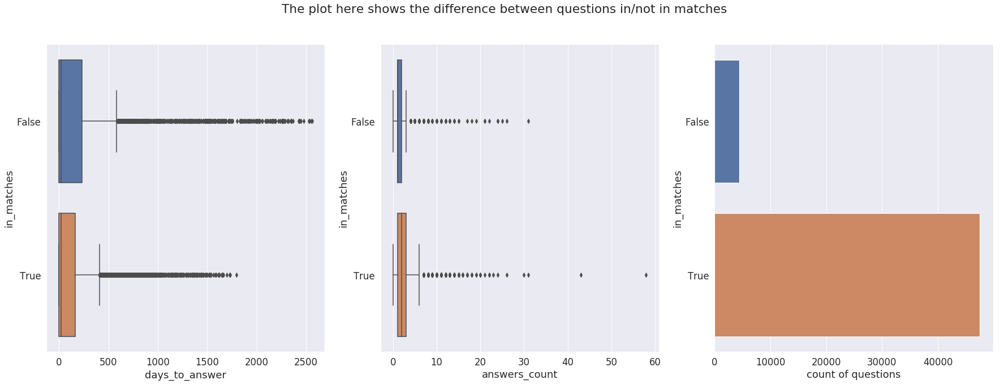

In [460]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 10), sharey=False, sharex=False)
sns.boxplot(y='in_matches', x='days_to_answer', orient='h', data=q_and_a, ax=ax1)
sns.boxplot(y='in_matches', x='answers_count', orient='h', data=q_and_a_groupped, ax=ax2)
sns.countplot(y='in_matches', data=q_and_a, ax=ax3)
ax3.set_xlabel('count of questions')
plt.suptitle('The plot here shows the difference between questions in/not in matches')
plt.show()